## GA Draft Paper: Constantine Chrysostomou ##

### Identifying Heart Conditions from Audio Recordings

### 05/03/2017 ###



## Description ##

This is a question devised by: [Bentley et al](http://www.peterjbentley.com/heartchallenge/).

Signs of potential heart conditions can be identified from abnormal heartbeats. Doctors can diagnose abnormal beats via a stethoscope. A heartbeat can be defined by repeated patterns of two discerning sounds, lub (aka S1) and dub (aka S2). Each sound corresponds to the opening and closing of valves in the heart (A detailed description can be [found here](https://www.khanacademy.org/science/health-and-medicine/circulatory-system/circulatory-system-introduction/v/lub-dub)). The ability to design methods for identifying abnormalities in heartbeats without the need of a doctor could have a signficant impact on the ability to catch early signs of heart disease.

The task of this problem is to demonstrate that machine learning algorithms can be used to correctly classify the lub/dub sounds in a heartbeat and subsequently identify abnormalities in heartbeats.  Data is provided from both 'real-world' situations where recordings were provided from recordings taken from non-medical devices (i.e. an iphone), and from a hospital environment using digital stethoscopes. Note, the former (mobile device recordings) will contain a higher amount of bacgkround noise.

The problem has been broken down into two challenges:
1. Given a set of digital recordings, identify time points in each file that correspond to a lub or dub event
2. Given a set of digital recordings and known abnormalities, classify heartbeats by potential conditions (refer [here](https://www.khanacademy.org/science/health-and-medicine/circulatory-system-diseases/heart-valve-diseases/v/systolic-murmurs-diastolic-murmurs-and-extra-heart-sounds-part-1) for details):
 * Normal heartbeat
 * Murmur
 * Extra heart sound
 * Artifact
 * Extrasystole


_______________________

## The Data ##

### Datasets ###
The creator of the dataset has provided two datasets. These datasets can be downloaded [here](http://www.peterjbentley.com/heartchallenge/). 

**DatasetA (176 wav files): ** The source of this data is provided from the general public via the iStethoscope Pro iPhone App

**DatasetB (656 wav files): ** The source of this data is provided from a clinical trial in hospitals using a digital stethoscope.

The following image further describes the datasets:

<img src='heart_dataset_description.PNG'/>

### Training ###

1. In order to train soundfiles to demarcate lub/dub events, two files have been provided for each dataset. The files, [A/B]training_normal.csv are simple text files that explicity write out the exact timepoint at which a LUB sound can be heard in a specific file and, similarly, at which time point a DUB sound can be heard in a audo file. 

2. In order to train heart conditions, each audo wave file in the training sets are prepended with their heart condition. For example, a soundfile corresponding to a heart murmur is labelled as: murmur__160_1307100683334_A.wav


### Evaluation ###

1. In order to evaluate challenge 1, an excel file has been provided in the Evaluation.zip file. this excel file allows users to paste in their predictions for when a lub/dub is heart in specific sound files. given the provided answers, a resulting score will be produced summarizing how close those results were to the true positions of the S1/S2 sounds

2. In order to evaluate challenge 2, an excel file has been provided where users can provide their predictions of heart conditions in all "unlabelled" audo files (i.e. Bunlabelledtest__300_1311772096120_C.wav). The resulting file will summarize the precision and accuracy of the resulting calls.


_______________________


______________

## Getting Started ##

**The following modules will be imported for working with the wav files:**
1. soundfile: we will use this module to read/write wave files
2. scipy.fftpack: this set of libraries contains functions for converting amplitude vs time signal into amplitude vs frequency (converts to fourier signal via fast fourier transform)
3. scipy.signal: use these methods to perform 'low pass filtering' (i.e. filter out high frequencies which contribute to a file)

In [2]:
import soundfile as sf
import os
import numpy as np
import pandas as pd
from scipy import fftpack, signal
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from scipy.signal import butter, lfilter, freqz
from matplotlib import pyplot as plt
from collections import OrderedDict

%matplotlib inline

In [3]:
# change font sizes in plots
import matplotlib.pylab as pylab
params = {'legend.fontsize': 'x-large',
          'figure.figsize': (15, 5),
         'axes.labelsize': 'x-large',
         'axes.titlesize':'x-large',
         'xtick.labelsize':'x-large',
         'ytick.labelsize':'x-large'}
pylab.rcParams.update(params)

## Working with WAV files ##

Using the soundfile module, we can read in a wave file into a numpy array. The number of elements in the array represents the total "frames" in that file (in other words, the number of times 'sound' was sampled in the recording). The value of each elemen t in the array is simply the 'amplitude' of sound at that frame.

**The samplerate/framerate of a wave file represents the total number of 'frames' captured per second**

In [4]:
def load_wav(wav_path):
    """
        Load a wav file into a numpy array
        
        Args:
            wav_path (string): location of the wav file
            
        Returns:
            sound_arr (numpy array): a 1D array of the sound file
            samplerate (int): The sample rate of the sound file
    """
    sound_arr, samplerate = sf.read(wav_path)
    
    return sound_arr, samplerate

sample_file = 'sample_data/normal__201104141251.wav'

sound_arr, samplerate = load_wav(sample_file)

print('The sample rate is: ' + str(samplerate) +' frames/second')

The sample rate is: 44100 frames/second


In [5]:
print('The resulting wav file (Total shape={0} frames): '.format(sound_arr.shape[0]))
print(sound_arr)

The resulting wav file (Total shape=336831 frames): 
[ 0.00134277  0.0012207   0.0012207  ...,  0.00030518  0.00015259
  0.00012207]


**The above shows that the sample wav file provided is 336831 frames and is in the format of a 1-D numpy array. To convert the data to 'time' we just need to divide the # of total frames over the frame rate: **

\begin{equation*}
frames/(frames/second) = second
\end{equation*}

In [103]:
print('Total length of wav file: {0} seconds'.format(str(sound_arr.shape[0]/(1.0*samplerate))))

Total length of wav file: 7.63789115646 seconds


** To get an idea of what the actual audio file looks like however, simply plot the amplitude signal in the numpy array over time **

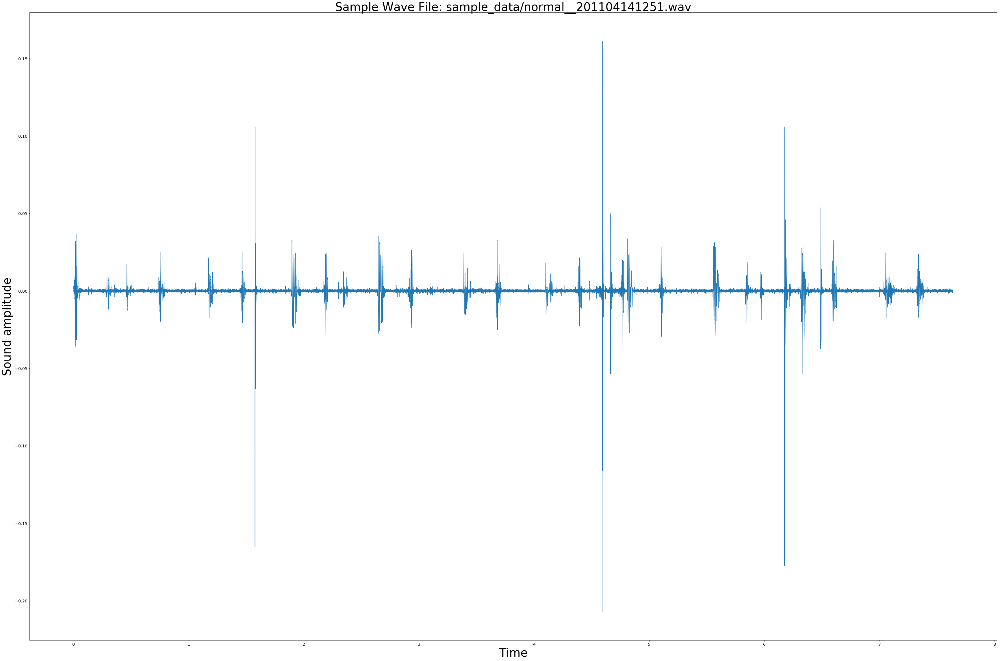

In [104]:
fig = plt.figure(figsize=(60, 40))
ax = plt.subplot(111)
ax.plot(
    np.arange(sound_arr.shape[0])/(1.0 * samplerate),
    sound_arr
)
plt.title('Sample Wave File: sample_data/normal__201104141251.wav', fontsize=40)
ax.set_xlabel('Time', fontsize=40)
ax.set_ylabel('Sound amplitude', fontsize=40)

** From the plot above we can see clear peaks most likely corresponding to the LUB/DUB sounds. However, we also notice dense areas that look like white noise. The next step is to use a low-pass filter to try and clean up the data and remove any noise **

A low pass filter simply removes the high frequency noise data from a file. The cutoff for a 'high frequency' is determined by the user. For our data we will use 50hz as the high frequency cutoff

In [7]:
#   creating-lowpass-filter-in-scipy-understanding-methods-and-units
# Taken from  https://stackoverflow.com/questions/25191620/
def butter_lowpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

def butter_lowpass_filter(data, cutoff, fs, order=5):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y


def filter_noise(signal, cutoff, samplerate):    
    """
    Runs a low pass filter on a signal. High frequencies are defined as those >=cutoff
    
    Args:
        signal (numpy array): The signal file that needs to be filtered
        cutoff (int): A frequency value (in hertz) to treat as the high frequency cutoff
        samplerate (int): The framerate of the file
    """
    # Filter the data, and plot both the original and filtered signals.
    return butter_lowpass_filter(signal, cutoff, samplerate)



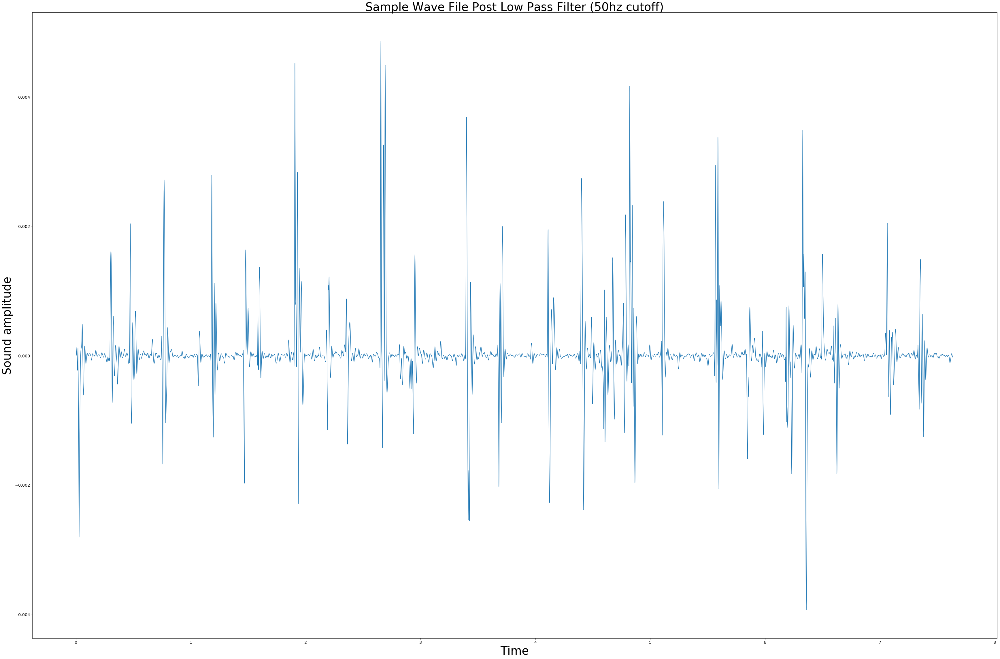

In [8]:
sound_arr_noise_filtered = filter_noise(sound_arr, 50, samplerate)
fig = plt.figure(figsize=(60, 40))
ax = plt.subplot(111)
ax.plot(
    np.arange(sound_arr_noise_filtered.shape[0])/(1.0 * samplerate),
    sound_arr_noise_filtered
)
plt.title('Sample Wave File Post Low Pass Filter (50hz cutoff)', fontsize=40)
ax.set_xlabel('Time', fontsize=40)
ax.set_ylabel('Sound amplitude', fontsize=40)

** The sound file shows a repeated pattern. This pattern is most likely mainly contributed by the hearbeat. When analyzing audio files its sometimes usefull to be able to look at it in the frequency domain. I.e. rather than look at amplitude vs time, look at amplitude vs frequency **

Frequencies with high amplitudes contribute most to the overal pattern/repeated signals in the audio file

(-1000, 1000)

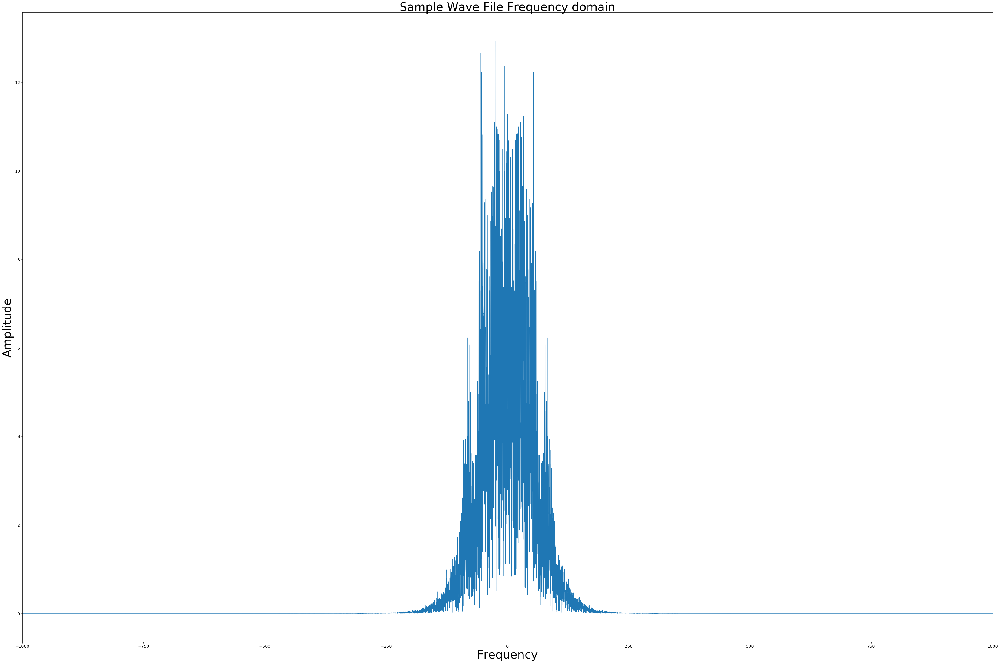

In [60]:
def get_fourier(signal, samplerate):
    """
    Convert a signal from the time domain to the frequency domain
    
    Args:
        signal (numpy array): array to convert
        samplerate (int): framerate of the signal
        
    Returns:
        four_series (pd.Series): A series of values. Index represents a frequency, values represents amplitude in each freq        
    """
    tmp = signal[~np.isnan(signal)]
    fft_signal = fftpack.fftshift(fftpack.fft(tmp))
    fft_freqs = fftpack.fftshift(fftpack.fftfreq(tmp.shape[0], 1.0/samplerate))
    return pd.Series(fft_signal, index=fft_freqs)

four_arr = get_fourier(sound_arr_noise_filtered, samplerate)

fig = plt.figure(figsize=(60, 40))
ax = plt.subplot(111)
ax.plot(
    four_arr.index,
    np.abs(four_arr.values)
)
plt.title('Sample Wave File Frequency domain', fontsize=40)
ax.set_xlabel('Frequency', fontsize=40)
ax.set_ylabel('Amplitude', fontsize=40)
ax.set_xlim([-1000, 1000])

The results show that that the majority of the signal is confied by only a few low frequencies. The data is pretty noisy so we can try to 'smooth' the signal

In [79]:
def smooth_data(vals, window=50, lim=1000, normalize=True, cutoff=0.05):
    tmp = vals.rolling(window=window).mean().iloc[list(np.arange(0, vals.shape[0], window))].dropna()
    if normalize:
        tmp = tmp/(1.0 * np.abs(tmp.values).max())
    tmp[tmp<cutoff] = 0
    return tmp.loc[0:lim]
    

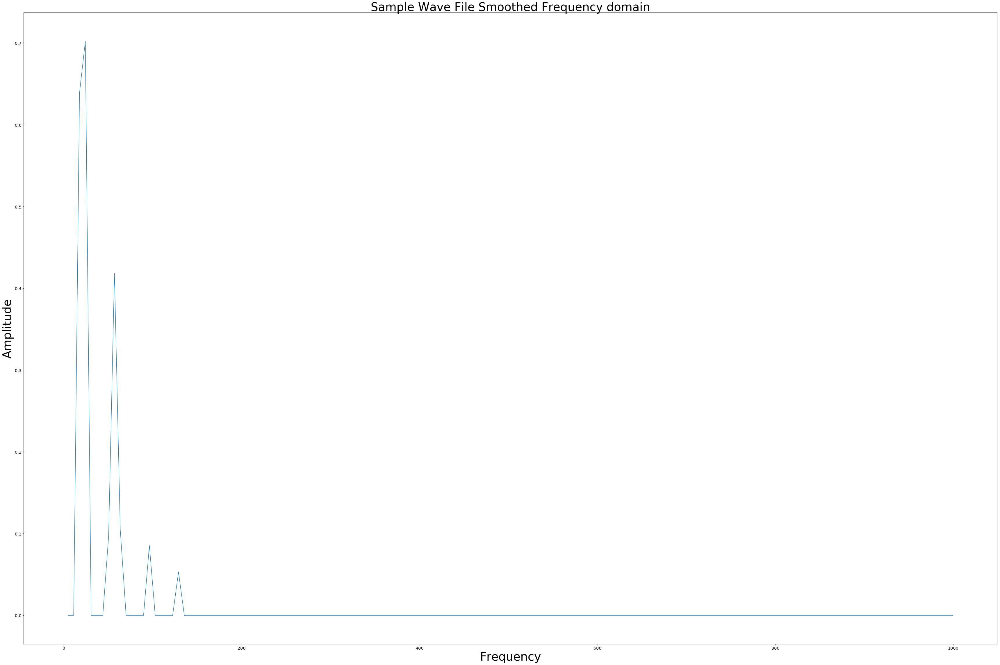

In [81]:
smoothed_arr = smooth_data(four_arr)

fig = plt.figure(figsize=(60, 40))
ax = plt.subplot(111)
ax.plot(
    smoothed_arr.index,
    np.abs(smoothed_arr.values)
)
plt.title('Sample Wave File Smoothed Frequency domain', fontsize=40)
ax.set_xlabel('Frequency', fontsize=40)
ax.set_ylabel('Amplitude', fontsize=40)

In [ ]:

plt.figure(figsize=(80, 40))
signal_results = {}
for i in range(21):
    plt.subplot(7, 3, i + 1)
    tmp = normal_group.filtered_signal_df.iloc[i].dropna()
    fft_signal = fftpack.fft(tmp)
    fft_freqs = fftpack.fftfreq(tmp.shape[0], normal_group.samplerate)
    lim = range(1000)
    win = 50

    tmp2 = pd.Series(np.abs(fft_signal[lim]), index=fft_freqs[lim])
    tmp2 = tmp2.rolling(window=win).mean().iloc[list(np.arange(0, tmp2.shape[0], win))].dropna()
    signal_results[tmp.name] = pd.Series(np.abs(tmp2.values)/(1.0*np.abs(tmp2.values).max()), index=tmp2.index)
    plt.plot(tmp2.index, np.abs(tmp2.values)/(1.0*np.abs(tmp2.values).max()))
    

_____________________

## Challenge 1: Classifying lub/dub signal ###

## Identifying features for S1/S2 classification ##


** Next we want to demarcate the sample file into its heartbeat events: lub(S1)/dub(S2). **

The file "training_nromal_seg" defines when S1/S2 events occur in the audo file:

* Each row in the file represents a specific auto file which can be identified by its index
* Each column represents either an S1 or an S2 event. The value in each row/column (cell) represents the exact frame within the file that corresponds to either the S1 or S2 event

In [9]:
print('First ten lines of S1/S2 demarcation file')
training_sound_events = pd.read_csv('sample_data/Atraining_normal_seg.csv', sep=',', index_col=0)
training_sound_events.head(10)

First ten lines of S1/S2 demarcation file


,S1,S2,S1.1,S2.1,S1.2,S2.2,S1.3,S2.3,S1.4,S2.4,...,S2.14,S1.15,S2.15,S1.16,S2.16,S1.17,S2.17,S1.18,S2.18,Unnamed: 39
201102081321.aif,10021.0,20759,35075,47244,62992,73729,88761,101646,115246,127415,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201102260502.aif,NaN,11526,27941,42197,58163,71278,88955,102641,122028,134573,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201103090635.aif,5366.0,17632,31432,44464,59030,71296,86629,99661,116527,128793,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201103140132.aif,16358.0,29272,89539,105036,128282,142057,170469,183383,207490,221265,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201103140822.aif,3444.0,18080,44770,58545,84374,98149,123977,134309,157555,175635,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201103151912.aif,3244.0,12053,25829,61128,79208,96427,117090,133448,152389,167886,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201103221214.aif,27831.0,39095,54667,65601,81173,92769,108341,119605,135509,146442,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201104141251.aif,21189.0,32879,51876,64297,83294,96446,116904,129326,149053,162205,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
201105011626.aif,NaN,2855,15497,23246,35299,43048,55962,63711,75764,84374,...,287559.0,302195.0,307361.0,321136.0,328885.0,338355.0,347826.0,360740.0,381403.0,389151.0
201105021654.aif,24481.0,39781,79563,94863,126229,140765,169836,185136,215737,230273,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Locate the row in the dataframe that corresponds to the current file of interest

In [10]:
sample_file_S1_S2_demarcation = training_sound_events.loc['201104141251.aif'].dropna()
sample_file_S1_S2_demarcation

S1       21189.0
S2       32879.0
S1.1     51876.0
S2.1     64297.0
S1.2     83294.0
S2.2     96446.0
S1.3    116904.0
S2.3    129326.0
S1.4    149053.0
S2.4    162205.0
S1.5    180471.0
S2.5    192623.0
S1.6    211889.0
S2.6    225041.0
S1.7    245499.0
S2.7    257920.0
S1.8    279109.0
S2.8    290800.0
Name: 201104141251.aif, dtype: float64

There are 9 S1/S2 pairs of events. What does it look like when the S1/S2 events are plotted along with the sound file:

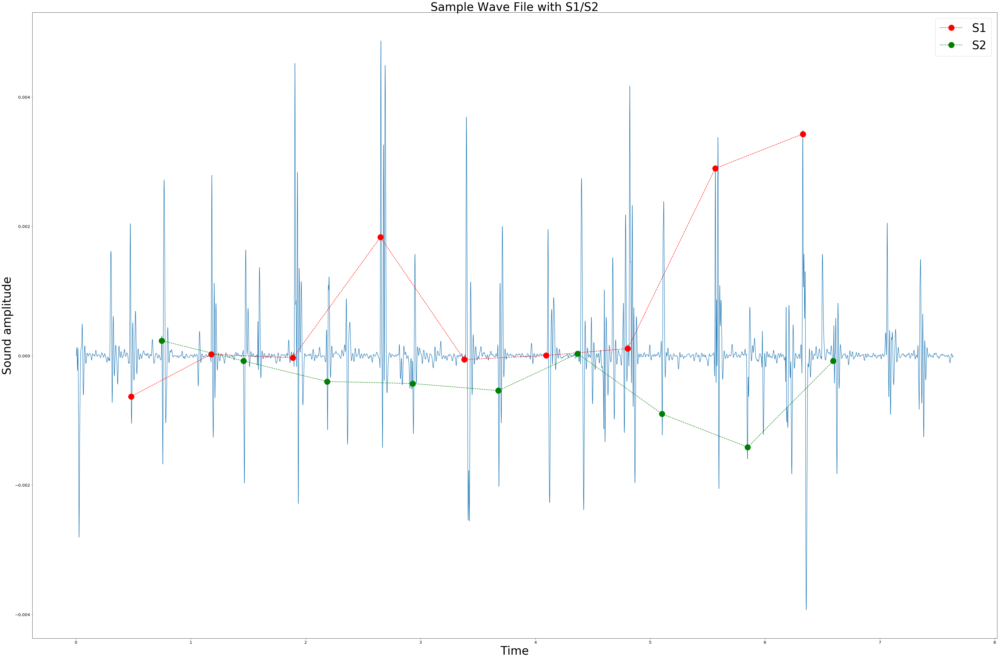

In [11]:
# group rows by S2 (S2.1, S2.2, S2.3..) / S1 (S1.1, S1.2, S1.3)
S1_S2_groups = sample_file_S1_S2_demarcation.groupby(by=lambda x: x.split('.')[0]).groups
s1_ind = sample_file_S1_S2_demarcation.loc[S1_S2_groups['S1']].astype(int)
s2_ind = sample_file_S1_S2_demarcation.loc[S1_S2_groups['S2']].astype(int)
s1_amplitude = sound_arr_noise_filtered[s1_ind]
s2_amplitude = sound_arr_noise_filtered[s2_ind]

fig = plt.figure(figsize=(60, 40))
ax = plt.subplot(111)
ax.plot(
    np.arange(sound_arr_noise_filtered.shape[0])/(1.0 * samplerate),
    sound_arr_noise_filtered
)
ax.plot(
    s1_ind/(1.0 * samplerate),
    s1_amplitude,
    'o--r',
    label='S1',
    markersize=20,
)
ax.plot(
    s2_ind/(1.0 * samplerate),
    s2_amplitude,
    'o--g',
    label='S2',
    markersize=20,
)
plt.legend(fontsize=40)
plt.title('Sample Wave File with S1/S2', fontsize=40)
ax.set_xlabel('Time', fontsize=40)
ax.set_ylabel('Sound amplitude', fontsize=40)

### 1. Potential feature: signal amplitude at S1 or S2 ###

From the plot above we can see how the heartbeat occurs as expected: We hear a "lub(S1)" and then a "dub(S2)".  Both signals look similar and are characterized near peaks/spikes that raise then drop. 

Maybe we can look at the amplitude of the signal to see if there is any difference between S1/S2 events

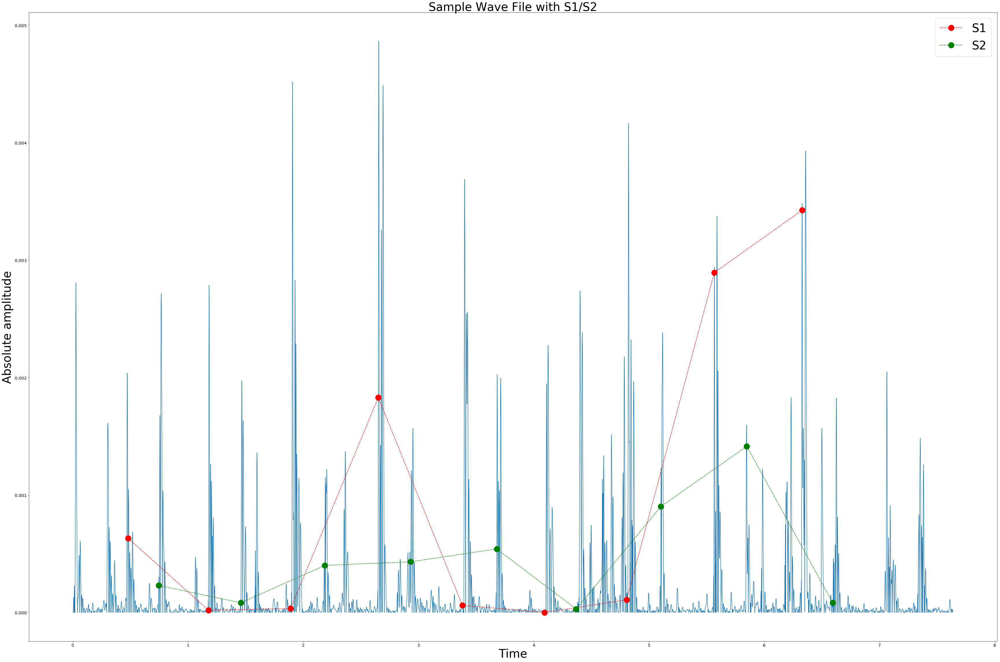

In [12]:
# group rows by S2 (S2.1, S2.2, S2.3..) / S1 (S1.1, S1.2, S1.3)
S1_S2_groups = sample_file_S1_S2_demarcation.groupby(by=lambda x: x.split('.')[0]).groups
s1_ind = sample_file_S1_S2_demarcation.loc[S1_S2_groups['S1']].astype(int)
s2_ind = sample_file_S1_S2_demarcation.loc[S1_S2_groups['S2']].astype(int)
s1_amplitude = sound_arr_noise_filtered[s1_ind]
s2_amplitude = sound_arr_noise_filtered[s2_ind]

fig = plt.figure(figsize=(60, 40))
ax = plt.subplot(111)
ax.plot(
    np.arange(sound_arr_noise_filtered.shape[0])/(1.0 * samplerate),
    np.abs(sound_arr_noise_filtered)
)
ax.plot(
    s1_ind/(1.0 * samplerate),
    np.abs(s1_amplitude),
    'o--r',
    label='S1',
    markersize=20,
)
ax.plot(
    s2_ind/(1.0 * samplerate),
    np.abs(s2_amplitude),
    'o--g',
    label='S2',
    markersize=20,
)
plt.legend(fontsize=40)
plt.title('Sample Wave File with S1/S2', fontsize=40)
ax.set_xlabel('Time', fontsize=40)
ax.set_ylabel('Absolute amplitude', fontsize=40)

Absolute value of the amplitudes seem to suggest that S1 values may have a higher signal than S2. But an issue is that these S1/S2 points are 'near' the local maximums but are not the actual local maximas. So it might be more intuitive to "sum" all nearby amplitudes in an effort to capture the local maximas. But what would be a good window size in this case

(2.5375056689342403, 2.7642630385487528)

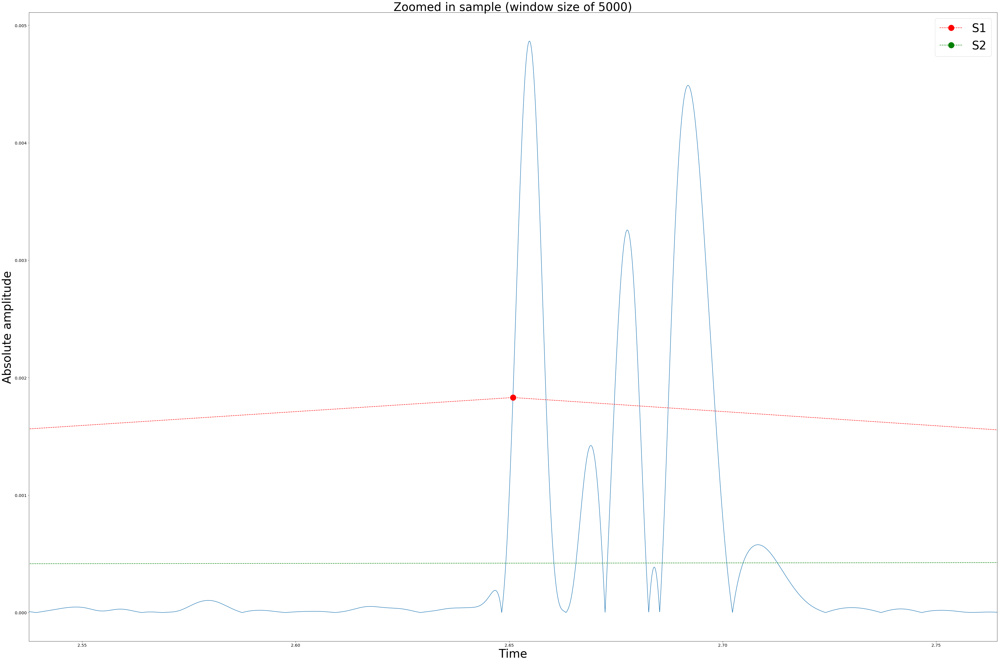

In [13]:
window=5000

fig = plt.figure(figsize=(60, 40))
ax = plt.subplot(111)
ax.plot(
    np.arange(sound_arr_noise_filtered.shape[0])/(1.0 * samplerate),
    np.abs(sound_arr_noise_filtered)
)
ax.plot(
    s1_ind/(1.0 * samplerate),
    np.abs(s1_amplitude),
    'o--r',
    label='S1',
    markersize=20,
)
ax.plot(
    s2_ind/(1.0 * samplerate),
    np.abs(s2_amplitude),
    'o--g',
    label='S2',
    markersize=20,
)
plt.legend(fontsize=40)
plt.title('Zoomed in sample (window size of {0})'.format(window), fontsize=40)
ax.set_xlabel('Time', fontsize=40)
ax.set_ylabel('Absolute amplitude', fontsize=40)
ax.set_xlim([(116904.0-window)/(1.0*samplerate), (116904.0+window)/(1.0*samplerate)])

Lets consider the "sum" of all amplitudes within a window size of 5000

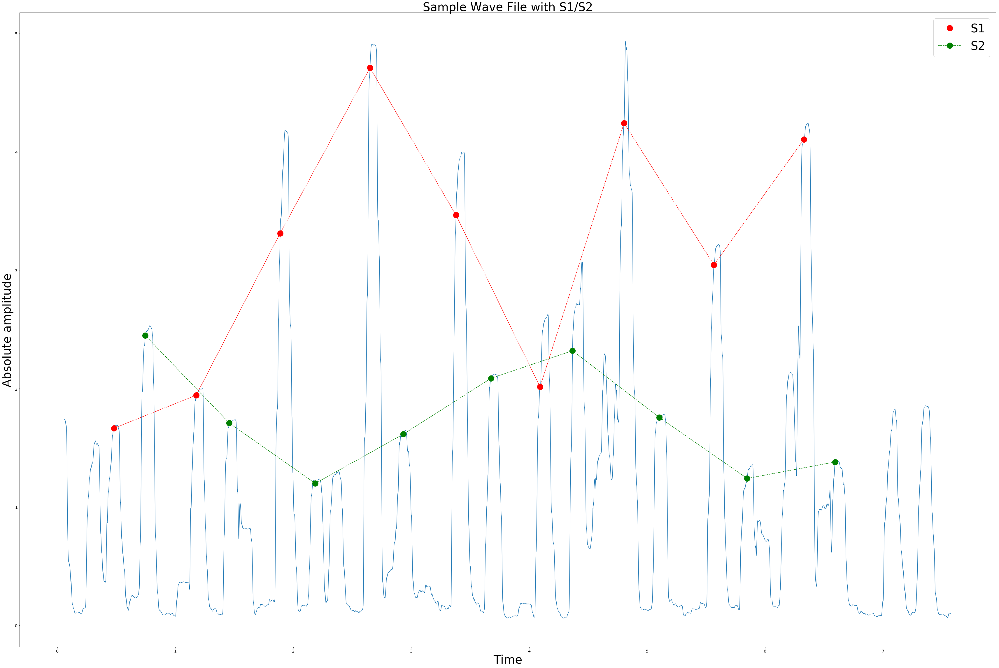

In [42]:
window = 5000

binned_sounds = np.abs(pd.Series(sound_arr_noise_filtered)).rolling(window=5000, center=True).apply(lambda x: x.sum())

s1_amplitude = binned_sounds[s1_ind]
s2_amplitude = binned_sounds[s2_ind]

fig = plt.figure(figsize=(60, 40))
ax = plt.subplot(111)
ax.plot(
    np.arange(binned_sounds.shape[0])/(1.0 * samplerate),
    np.abs(binned_sounds)
)
ax.plot(
    s1_ind/(1.0 * samplerate),
    np.abs(s1_amplitude),
    'o--r',
    label='S1',
    markersize=20,
)
ax.plot(
    s2_ind/(1.0 * samplerate),
    np.abs(s2_amplitude),
    'o--g',
    label='S2',
    markersize=20,
)
plt.legend(fontsize=40)
plt.title('Sample Wave File with S1/S2', fontsize=40)
ax.set_xlabel('Time', fontsize=40)
ax.set_ylabel('Absolute amplitude', fontsize=40)

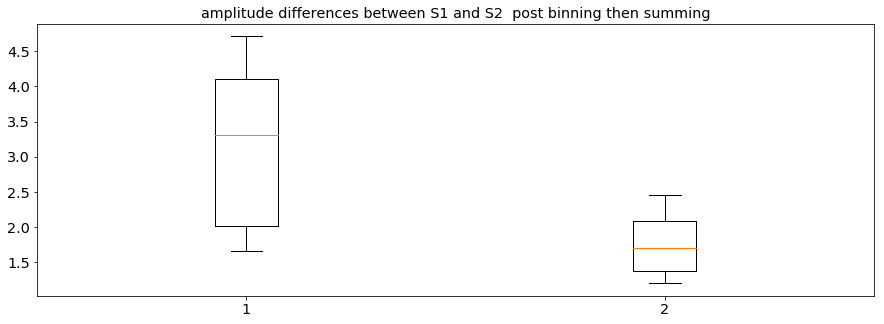

In [46]:
plt.boxplot(
    [s1_amplitude.dropna().values,   s2_amplitude.dropna().values]
)
plt.title('amplitude differences between S1 and S2  post binning then summing')

Binning then summing seems to show differences between S1/S2 in this *SPECIFIC* audio file. but there are many ways we can handle signals within a bin.

What if we repeated the binning but instead we asked for the maximum value in a bin

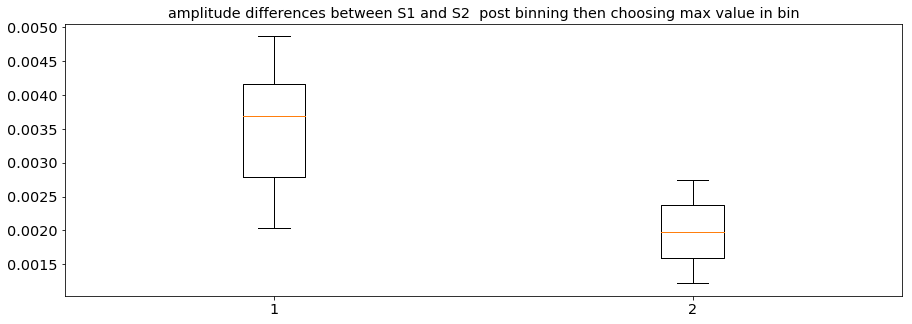

In [48]:
window = 5000

binned_sounds = np.abs(pd.Series(sound_arr_noise_filtered)).rolling(window=5000, center=True).apply(lambda x: x.max())

s1_amplitude = binned_sounds[s1_ind]
s2_amplitude = binned_sounds[s2_ind]

plt.boxplot(
    [s1_amplitude.dropna().values,   s2_amplitude.dropna().values]
)
plt.title('amplitude differences between S1 and S2  post binning then choosing max value in bin')


In this case the differences between the medians did not change much, but we see less overlap between the distributions. So maybe this is another method worth considering. 

*But for now, lets just go with the average absolute value of amplitude within a bin *

### 2. Potential feature: local frequencies of S1/S2 ###

In addition to the amplitude at each time point, it could also be interesting to look at the local frequency of signals near an S1/S2 data point. 

Before we looked at the frequency of the entire signal, but this time lets using the 'binned window' and calculate the frequency domain within each bin.

(This is identical to running a [spectrogram](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.spectrogram.html) analysis on a signal)

In [96]:
def np_pad(arr, arr_len):
    """
        Add zeros to an array to force the length of an array to be arr_len
    """
    new_arr = np.zeros(arr_len)
    new_arr[:arr.shape[0]] = arr
    return new_arr

def get_local_frequency(signal, center_point, window, normalize=True, cutoff=0.05):
    """
        Given a signal and an identified region of interest (center_point). Return the freuqency domain of the data within a
        specific window size centered around the center_point
        
        Args:
            signal (np array): signal of interest
            center_point (int): Position/coordinate within the signal that will be in the center of the window
            window (int): Size of the window/# of datapoints merged
            
        Returns:
            four_arr (pd.Series): Series of the fourier signal
    """
    tmp = signal[~np.isnan(signal)]
    # return the left most point in the window (cannot be smaller than 0)
    left_point = max(0, center_point - window/2)
    # return the right most point in the window (cannot be larger than array size)
    right_point = min(center_point + window/2, tmp.shape[0])
    # take the window slice in that region
    subset = tmp[range(left_point, right_point + 1)]
    if subset.shape[0] < window:
        # its too small...we want to make sure all signals are equal length
        subset = np_pad(subset, window)
    # calculate the frequencies (only take the first n/2 samples (the remainder are the same frequency but on the - scale (due to symmetry)))
    freqs = fftpack.fftfreq(subset.shape[0])[:subset.shape[0]/2]
    amplitude = np.abs(fftpack.fft(subset))[:subset.shape[0]/2]
    if normalize:
        amplitude = amplitude/amplitude.max()
    amplitude[amplitude<cutoff] = 0
    return pd.Series(amplitude, index=freqs)

In [167]:
# Get spectrogram for S1 data
s1_data = {}
for pt in list(s1_ind):
    s1_data[pt] = get_local_frequency(sound_arr_noise_filtered, pt, 2*window)
print('Frequencies for S1 data')
pd.DataFrame(s1_data).head(20)

Frequencies for S1 data


,21189,51876,83294,116904,149053,180471,211889,245499,279109
0.0000,0.433034,0.465353,1.000000,1.000000,0.158596,0.078743,0.942719,0.973856,0.317217
0.0001,0.270882,0.485098,0.952477,0.936568,0.262303,0.179855,0.946706,1.000000,0.514843
0.0002,0.224162,0.364476,0.708519,0.638951,0.536091,0.511582,0.811035,0.711744,0.786154
0.0003,0.280570,0.289447,0.431210,0.323012,0.719164,0.793202,0.721233,0.327493,1.000000
0.0004,0.484611,0.355813,0.737377,0.369560,0.881998,0.940476,0.734673,0.274560,0.863501
0.0005,0.605960,0.716483,0.732376,0.690426,0.963523,0.891458,0.428020,0.380088,0.905751
0.0006,0.501349,0.668475,0.338313,0.790439,1.000000,0.732062,0.368893,0.250420,0.472687
0.0007,0.312874,0.762511,0.216206,0.638000,0.833591,0.770390,1.000000,0.378273,0.515597
0.0008,0.526204,0.613627,0.551517,0.277871,0.636836,1.000000,0.809502,0.675371,0.120730
0.0009,0.909904,0.661713,0.446770,0.253426,0.293980,0.984902,0.000000,0.930296,0.463787


In [166]:
# Get spectrogram for S2 data
s2_data = {}
for pt in list(s2_ind):
    s2_data[pt] = get_local_frequency(sound_arr_noise_filtered, pt, 2*window)
print('Frequencies for S2 data')
pd.DataFrame(s2_data).head(20)

Frequencies for S2 data


,32879,64297,96446,129326,162205,192623,225041,257920,290800
0.0000,0.359247,0.225134,0.533753,0.593245,0.121558,0.209256,0.821476,0.270348,0.433755
0.0001,0.295641,0.386696,0.484301,0.536858,0.276396,0.318230,0.770951,0.486525,1.000000
0.0002,0.397099,0.615255,0.425621,0.731226,0.487391,0.524000,0.829640,0.850794,0.356829
0.0003,0.456533,0.762597,0.645856,0.846636,0.584068,0.725344,0.774620,0.888395,0.867716
0.0004,0.688581,0.770278,0.536073,0.371601,0.587343,0.889868,0.874631,0.714631,0.555730
0.0005,0.700277,0.791323,0.657512,0.852339,0.469014,0.973941,0.943154,1.000000,0.701532
0.0006,0.888755,0.646311,0.730567,0.794871,0.183571,1.000000,0.949336,0.941198,0.642526
0.0007,1.000000,0.682055,0.733139,1.000000,0.182387,0.981454,1.000000,0.744068,0.616654
0.0008,0.894773,0.826974,1.000000,0.996216,0.528146,0.836474,0.954276,0.481068,0.716315
0.0009,0.851325,0.923344,0.920659,0.854990,0.806152,0.657922,0.856577,0.302575,0.410538


** A better way to compare the spectrograms is to use a heatmap **
1. Rows in the heatmap will correspond to the top 20 frequencies
2. Columns in the heatmap will correspond to the average contribution of frequency in datapoints binned as S1 vs datapoints binned as S2
3. Colors of each box will represent the relative contirbution of each frequency in a bin

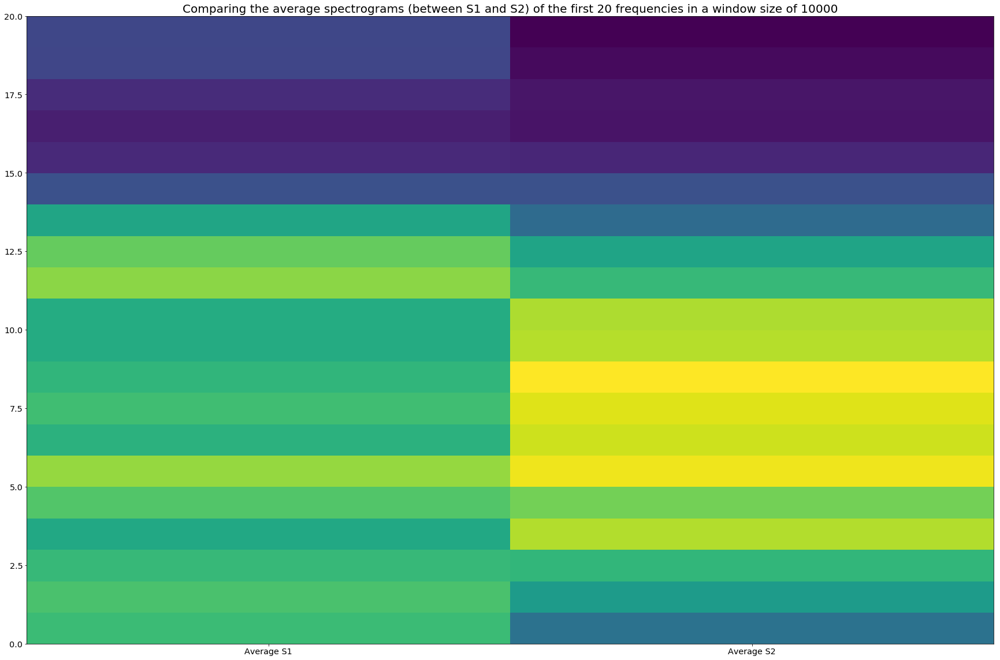

In [182]:
merge_s1_s2_local_frequencies = pd.concat([pd.DataFrame(s1_data), pd.DataFrame(s2_data)], axis=1, keys=['S1', 'S2'])
plt.figure(figsize=(30, 20))
# data = merge_s1_s2_local_frequencies.iloc[:20].values
# normalized = (data - data.mean(axis=1).reshape(-1, 1))/(data.std(axis=1).reshape(-1,1))
# normalized[np.isnan(normalized)] = 0
averaged_by_s1_s2 = merge_s1_s2_local_frequencies.apply(lambda x: pd.Series([x['S1'].mean(), x['S2'].mean()]), axis=1).iloc[:20].values
averaged_by_s1_s2[np.isnan(averaged_by_s1_s2)] = 0
ax = plt.subplot(111)
plt.pcolor(averaged_by_s1_s2)
plt.title(
    'Comparing the average spectrograms (between S1 and S2) of the first 20 frequencies in a window size of {0}'.format(2*window),
    fontsize=20,
)

ax.set_xticks([0.5, 1.5])
ax.set_xticklabels(['Average S1', 'Average S2'])


We might be able to use the spectrogram as a method for differentiating an S1 vs S2 signal. The contribution of each local frequency within a window will contribute to a feature for the dataset.


-------------------

## Pipeline for extracting features and permforing classiications ##


**Based on the above examples,  the following sets of steps will be performed on the data:**
1. Load the wav files into numpy arrays via soundfile module
2. Load the table of numpy arrays into a dataframe that is indexed by the filepath
3. Perform a low pass filter on the data files
4. Load the training file which defines the S1/S2 demarcations for each file
5. Using the filenames to join tables, map the S1/S2 positions onto each wav file and identify where S1/S2 occurs
6. Generate feature 1:
    * Isolate the absolute amplitude at each positon
    * *Determine window size*
    * *Using the determined window isolate the average amplitdude in a bin*
7. Using hte demarcation file, extract S1, S2, and noise data points for each file (that is ignore all other data points not defined in the training set)
8. Isolate the features (amplitude and binned amplitude) for each S1/S2/noise data point
9. Calculate the local frequency at each datapoint using a window size of 2*window
10. Perform training on datasets using features described above and output of 0, 1, 2 where 0 = noise, 1 = S1, 2 = S2

Note: areas in italics require optimization


** Create a class that generates a series of helper functions for analyzing the data **

In [82]:
class heart_signal(object):
    """
    Create a class to store groups of .wav files 
    We can convert data into a dataframe and perform lowpass filtering, perform smoothing, mapping S1/S2 locations
    """    
    
    def __init__(self, folder_path=None, files=None, autoread_files=False):
        """
        when initialized just store the location of all the data files containing .wav files to read in
        """
        self.provided_files = []
        self.autoread_files = autoread_files
        if not(folder_path is None):
            for r, dlist, flist in os.walk(path):
                """
                read in all files provided by folder
                """
                for f in flist:
                    if not(f.endswith('.wav')):
                        continue
                    name = os.path.join(r, f)
                    self.provided_files.append(name)
        if not (files is None):
            for name in files:                
                if os.path.isfile(name) and name.endswith('.wav'):
                    self.provided_files.append(name)
                else:
                    print('Invalid file {0}'.format(name))
        
        if len(self.provided_files) == 0:
            raise Exception
        
        if self.autoread_files:
            self.create_df()
        else:
            self.signal_df = None
        
        self.nan_free = None
        self.s1 = None
        self.s2 = None
                
    
    def create_df(self):
        """
            Read the .wav data into a dataframe where we collect the signal/sound data at the provided sampling rate
        """
        _, self.samplerate = sf.read(self.provided_files[0])
        
        signal_array = []
        data = []
        for name in self.provided_files:            
            signal, samplerate = sf.read(name)
            signal_array.append(list(signal))
            data.append({'name': name, 'basename': os.path.basename(name), 'samplerate': samplerate})
        
        self.data_df = pd.DataFrame(data)
        self.signal_df = pd.DataFrame(signal_array, index=self.data_df['basename'])
        
        if len(self.data_df['samplerate'].unique()) != 1:
            print('The sample rate seems to be different for the provided files!')
        else:
            # we can actually assign "time data" to the columns of the dataframe
            # the "time" will be given in intervals defined by the sampling rate
            time_values = np.arange(0, (self.signal_df.shape[1]*1.0)/self.samplerate, self.samplerate)
            # self.signal_df.rename(columns=lambda x: (1.0 * x)/self.samplerate, inplace=True)
            
        self.filtered_signal_df = self.signal_df
            
    def get_signal_length_distribution(self, nbins=None):
        if self.signal_df is None:
            print('You must create_df() first!')
            return
        
        if nbins:
            return np.histogram(
                self.signal_df.apply(lambda x: len(x.dropna())/self.samplerate, axis=1)
            )
        else:
            return np.histogram(self.signal_df.apply(lambda x: len(x.dropna()), axis=1))
        
    def identify_null_values(self):
        """
        It makes sense for the data to have NaN at the end of the signal. This is because each .wav file is a different 
        length. But not sure if there is any NaN data in the middle of the file. So this makes sure there is only
        one spoint in the data that has Nan values (i.e. doesnt do 0 NaN 1 Nan 2 Nan Nan; but it can do 0 1 2 NaN NaN NaN)
        """
        check_for_nan = (normal_group.signal_df.isnull().diff(axis=1).iloc[:, 1:] == True).sum(axis=1)
        has_unusual_data = check_for_nan[check_for_nan>1]
        if has_unusual_data.shape[0] > 0:            
            self.nan_free = False
            print('WE found files with NaN in them')
        else:
            self.nan_free = True
            print('Files look good (no NaN in the middle)')
        return has_unusual_data.index
        
    def get_some_data(self, index, use_iloc=False):
        """
        return a copy of the signals
        """
        if use_iloc:            
            return self.signal_df.iloc[index].copy()
        else:            
            return self.signal_df.loc[index].copy()
        
    
    def pad_zero(self, check_nan_free = True):
        if check_nan_free and (self.nan_free is None or check_nan_free is False):
            print('Sorry I cannot do this function until I know all nan values have been handled correctly!')
            raise Exception
            return
            
        if self.nan_free is None:
            print("Warning: Im replacing all NaN points in the table with zeros but I havent checked if there are any Nan values in the middle of the dataset...this could screw up the results")
        elif self.nan_free is False:
            print('Warning: Im replacing all Nan points in the table with zeros but some datapoints with Nan are not at the end of the signal and might yield incorrect results')
        
        self.signal_df.fillna(0, inplace=True)
        
    def low_pass_filter(self, freq, limit=None, inplace=False):
        """
        Applies a low pass filter to the signal dataframe
        
        freq: low-pass filter cutoff
        
        returns:
            df (signal df)
        """
        if limit:
            subsample = self.signal_df.iloc[:limit]
        else:
            subsample = self.signal_df
                                           
        new_data = [filter_noise(d, freq, self.samplerate) for d in subsample.values]
    
        new_data_df = pd.DataFrame(new_data, index=subsample.index)
        time_values = np.arange(0, (new_data_df.shape[1]*1.0)/self.samplerate, self.samplerate)
        # new_data_df.rename(columns=lambda x: (1.0 * x)/self.samplerate, inplace=True)
        
        if inplace:            
            self.filtered_signal_df = new_data_df
        else:
            return new_data_df
            
    def heart_beat_rate_to_hz(self, rate_per_min=60):
        # rate_per_min = total (lub/dub) beats per minute
        beats_per_sec = (rate_per_min*1.0)/60
        return beats_per_sec
    
    def heart_beat_rate_to_sampling_rate(self, rate_per_min=60):
        """
        Given a heart beat rate, return the number of "frames" in 
        the wav file that captures a single beat within a window size
        """
        # rate_per_min = total (lub/dub) beats per minute
        beat_hz = self.heart_beat_rate_to_hz(rate_per_min)
        # samplerate => frames/second
        # beat_hz => beats/secon, inverse = seconds/beats
        # frames_per_heartbeat = (frames/second) * (second/beats) = frames/second
        frames_per_heartbeat = self.samplerate*(1/beat_hz)
        return frames_per_heartbeat
    
    def spectrogram(self, window_size, noverlap=None, additional_kwargs={}, 
        limit=None, randomly_select=None, keep_time_unit=False,
        use_filtered_data = True):
        
        random_signals = self.filtered_signal_df if use_filtered_data else self.signal_df
        
        if randomly_select:
            random_signals.subsample(randomly_select)        
            
        if limit:
            limit = min(limit, random_signals.shape[0])
            random_signals = random_signals.iloc[:limit]
        
        freqs_sampled, average_time_window, Sxx = signal.spectrogram(
            random_signals.values, self.samplerate, 
            nperseg=int(window_size), 
            noverlap=int(noverlap), 
            **additional_kwargs
        )
        
        if keep_time_unit is False:
            average_time_window *= np.round(self.samplerate)
        
        return freqs_sampled, average_time_window, \
                pd.Panel(Sxx, items=random_signals.index, major_axis=freqs_sampled, minor_axis=average_time_window)
    
    def return_S1_S2_position(self, heart_calls_df, inplace=True):
        """
            Given the dataframe where the S1/S2 or lub/dub demarcations have been called out already, 
            return the original data where 'S1' is filled in the proper index and 'S2' is filled in the proper indexes            
        """
        
        # isolate only the rows listed in heart_calls_df
        subset = self.signal_df.loc[normal_group.signal_df.index.intersection(heart_calls_df.index)]
        # make a dummy dataframe to store results
        result_calls = pd.DataFrame(np.nan, index=subset.index, columns=subset.columns)
        df = heart_calls_df.loc[self.signal_df.index.intersection(heart_calls_df.index)]
        
        # isolate the 'S1' columns from the test set (lub)
        s1_columns = [s for s in df.columns if s.startswith('S1')]
        
        # isolate the 'S2' columns from the test set (dub)
        s2_columns = [s for s in df.columns if s.startswith('S2')]
        
        # really slow and hacky code, but go through each row and find the frames that refer to S1 or S2
        # LABEL THAT ROW/COLUMN COMBINATION in the dummy dataframe
        for i, (r, v) in enumerate(df.iterrows()):
            s1_col = v[s1_columns].dropna().values
            result_calls.ix[i, s1_col] = 'S1'
            s2_col = v[s2_columns].dropna().values
            result_calls.ix[i, s2_col] = 'S2'
            
        if inplace:
            self.S1_S2_demarcation = result_calls
        else:
            return result_calls
    
    def return_S1_S2_noise_position(self, heart_calls_df, inplace=True):
        """
            Given the dataframe where the S1/S2 or lub/dub demarcations have been called out already, 
            return the original data where 'S1' is filled in the proper index and 'S2' is filled in the proper indexes            
        """
        
        # isolate only the rows listed in heart_calls_df
        subset = self.signal_df.loc[normal_group.signal_df.index.intersection(heart_calls_df.index)]
        # make a dummy dataframe to store results
        result_calls = pd.DataFrame(np.nan, index=subset.index, columns=subset.columns)
        df = heart_calls_df.loc[self.signal_df.index.intersection(heart_calls_df.index)]
        
        # isolate the 'S1' columns from the test set (lub)
        s1_columns = [s for s in df.columns if s.startswith('S1')]
        
        # isolate the 'S2' columns from the test set (dub)
        s2_columns = [s for s in df.columns if s.startswith('S2')]
        
        noise_columns = [s for s in df.columns if s.lower() == 'noise']
        
        # really slow and hacky code, but go through each row and find the frames that refer to S1 or S2
        # LABEL THAT ROW/COLUMN COMBINATION in the dummy dataframe
        for i, (r, v) in enumerate(df.iterrows()):
            s1_col = v[s1_columns].dropna().values
            result_calls.ix[i, s1_col] = 'S1'
            s2_col = v[s2_columns].dropna().values
            result_calls.ix[i, s2_col] = 'S2'
            noise_col = v[noise_columns].dropna().values 
            result_calls.ix[i, noise_col] = 'N'

            
        if inplace:
            self.S1_S2_demarcation = result_calls
        else:
            return result_calls
        
    def return_event_position(self, heart_calls_df, lambda_fxn=lambda x: True, label='label'):
        """
            Given the dataframe where the S1/S2 or lub/dub demarcations have been called out already, 
            return the original data where 'S1' is filled in the proper index and 'S2' is filled in the proper indexes            
        """
        
        # isolate only the rows listed in heart_calls_df
        subset = self.signal_df.loc[normal_group.signal_df.index.intersection(heart_calls_df.index)]
        # make a dummy dataframe to store results
        result_calls = pd.DataFrame(np.nan, index=subset.index, columns=subset.columns)
        df = heart_calls_df.loc[self.signal_df.index.intersection(heart_calls_df.index)]
        
        # isolate the columns which return true for the lambda_fxn
        return_columns = [s for s in df.columns if lambda_fxn(s)]
         
        # really slow and hacky code, but go through each row and find the frames that refer to the lambda_fxn
        # LABEL THAT ROW/COLUMN COMBINATION in the dummy dataframe
        for i, (r, v) in enumerate(df.iterrows()):
            s1_col = v[return_columns].dropna().values
            result_calls.ix[i, s1_col] = label
            
        return result_calls
    
    def bin_signal(self, nperseg, noverlap, fs=1.0):
        """
            given a window, return the indicies of the dataframe where data should be binned into it            
        """
        col_as_array = self.signal_df.columns
        skip = int(nperseg)
        overlap=int(noverlap)
        bins = OrderedDict()
        for c in np.arange(
            0,
            col_as_array.max(),
            skip - overlap
        ):
            p1 = c
            p2 = (c + skip)
            bins[(c + (skip)/2.0)/fs] = list(col_as_array[p1:p2])
        return bins
    
    def get_average_signal_in_bin(self, nperseg, noverlap, fs=1.0, method='mean'):
        binned_data = self.bin_signal(nperseg, noverlap, fs)
        x_vals = np.array(binned_data.keys())
        new_df = {}
        for k, val in binned_data.iteritems():
            if method == 'mean':
                new_df[k] = self.filtered_signal_df[val].mean(axis=1)
            elif method == 'max':
                # returns either the maximum or minimum value in a group
                new_df[k] = self.filtered_signal_df[val].apply(
                    lambda x: x[np.abs(x.dropna()).idxmax()] if len(x.dropna())>0 else np.nan,
                    axis=1,
                )  
                
            else:
                print('performing median')
                new_df[k] = self.filtered_signal_df[val].median(axis=1)
        return pd.DataFrame(new_df)
    
    def return_s1_s2_binned_data(self, s1_s2_df, nperseg, noverlap, fs=1.0):
        binned_data = self.bin_signal(nperseg, noverlap, fs)
        s1_s2_bins = self.return_S1_S2_position(s1_s2_df, inplace=False)
        
        new_df = {}
        for k, val in binned_data.iteritems():
            new_df[k] = s1_s2_bins[val].apply(
                lambda x: np.array(','.join(sorted(list(x.dropna().unique())))) if len(x.dropna()) > 0 else '',
                axis=1
            )
        return pd.DataFrame(new_df)
    
    def get_average_freq_contribution(self, frame_cutoff=1000, window=100):
        """
            1. Convert signal to frequency contributes
            2. Only consider frequencies within the first [:frame_cutoff] indexes
            3. Smooth out the signal/get an average coefficient of frequencies defined by the window
            4. only return coefficients in multiples of the window
        """
        
        def smoothed_coefficients(signal):
            fft_signal = fftpack.fft(signal.dropna())
            fft_freqs = fftpack.fftfreq(fft_signal.shape[0], 1.0/self.samplerate)
            lim = range(frame_cutoff)
            abs_sign = pd.Series(np.abs(fft_signal[lim]), index=fft_freqs[lim])
            abs_sign =  abs_sign.rolling(window=window).mean().iloc[range(0, abs_sign.shape[0], window)].dropna()
            return abs_sign/abs_sign.max()
            
        return self.filtered_signal_df.apply(smoothed_coefficients, axis=1).fillna(0)
        
    
        

## THE REMAINDER OF THIS PAPER IS STILL BEING WORKED ON AND THE CODE IS TENTATIVE ##

In [30]:
os.path.isfile('./set_a/Atraining_normal_seg.csv')

True

In [31]:
os.path.isfile('./set_b/Btraining_normal_seg.csv')

True

** Step 1) Read in normal heartbeat data (From the set_a) folder **

In [32]:
# define location
# path = './set_a'
df = pd.read_csv(
    './set_a/Atraining_normal_seg.csv', 
    index_col=0
)# .applymap(lambda x: (x*1.0)/normal_group.samplerate)

df = pd.read_csv(
    './set_b/Btraining_normal_seg.csv', 
    index_col=0
)

In [33]:
predicted_neither = df.apply(
    lambda x: pd.Series(
        sorted([x[i-1] + (x[i] - x[i-1])/2 for i in range(1, len(list(x.dropna())))])
    ),
    axis=1
)
predicted_neither.rename(columns={i: 'Noise' for i in predicted_neither.columns}, inplace=True)
predicted_neither = predicted_neither.applymap(lambda x: x if np.isnan(x) else int(np.round(x)))

In [34]:
files = list(df.index.map(lambda x: os.path.join('./set_a/', 'normal', 'normal__'+'.'.join(x.split('.')[:-1]) + '.wav')))


In [35]:
files2 = list(df.index.map(lambda x: os.path.join('./set_b/', 'normal__'+'.'.join(x.split('.')[:-1]) + '.wav'))) 

In [77]:
# normal_group = heart_signal(files=files)
# normal_group2 = heart_signal(files=files2)

Invalid file ./set_a/normal/normal__103_1305031931979_D1.wav
Invalid file ./set_a/normal/normal__103_1305031931979_D3.wav
Invalid file ./set_a/normal/normal__106_1306776721273_C1.wav
Invalid file ./set_a/normal/normal__106_1306776721273_D1.wav
Invalid file ./set_a/normal/normal__109_1305653646620_C.wav
Invalid file ./set_a/normal/normal__113_1306244002866_D.wav
Invalid file ./set_a/normal/normal__115_1306259437619_C.wav
Invalid file ./set_a/normal/normal__117_1306262456650_B.wav
Invalid file ./set_a/normal/normal__125_1306332456645_B.wav
Invalid file ./set_a/normal/normal__126_1306777102824_D.wav
Invalid file ./set_a/normal/normal__127_1306764300147_A.wav
Invalid file ./set_a/normal/normal__127_1306764300147_B.wav
Invalid file ./set_a/normal/normal__127_1306764300147_C1.wav
Invalid file ./set_a/normal/normal__128_1306344005749_B.wav
Invalid file ./set_a/normal/normal__128_1306344005749_D.wav
Invalid file ./set_a/normal/normal__128_1306344005749_D1.wav
Invalid file ./set_a/normal/normal

Exception: 

In [36]:
# create instance
normal_group = heart_signal(files=files2)
# read in wav data
normal_group.create_df()
# make sure there are no nan values before the end
# because this is empty there are no null values in the middle of the wav files
normal_group.identify_null_values()

Files look good (no NaN in the middle)


Index([], dtype='object', name=u'basename')

In [37]:
df.set_index(df.index.map(lambda x: 'normal__' + x.replace('.aif', '.wav').rstrip('f')), inplace=True)

In [38]:
predicted_neither.set_index(
    predicted_neither.index.map(lambda x: 'normal__' + x.replace('.aif', '.wav').rstrip('f')), inplace=True
)

In [39]:
sPos_and_noise = pd.concat([df, predicted_neither], axis=1).applymap(lambda x: x if np.isnan(x) else int(x) )

** Step 2: Filter out noisy data **

In [42]:
normal_group.low_pass_filter(50, inplace=True)
s1_s2_exact_pos = normal_group.return_S1_S2_noise_position(sPos_and_noise, inplace=False)

In [43]:
s1_s2_exact_pos.stack().reset_index().groupby(by=['basename', 'level_1']).apply(len).describe()

count    2716.0
mean        1.0
std         0.0
min         1.0
25%         1.0
50%         1.0
75%         1.0
max         1.0
dtype: float64

In [27]:
#suspected_noise = normal_group.return_event_position(
#    predicted_neither, lambda_fxn=lambda x: x=='Noise', label='N'
#)
# suspected_noise

In [44]:
# get "frequencies" from each sample
normalized_freq_per_sample = normal_group.get_average_freq_contribution()
# get "abs vlaue" from each sample
abs_values = normal_group.filtered_signal_df.abs()

In [45]:
# get "differences" in signal
abs_value_differences = normal_group.filtered_signal_df.abs().diff(axis=1)
abs_value_differences

,0,1,2,3,4,5,6,7,8,9,...,58710,58711,58712,58713,58714,58715,58716,58717,58718,58719
basename,,,,,,,,,,,,,,,,,,,,,
normal__103_1305031931979_D1.wav,NaN,5.208668e-08,2.509755e-07,8.193844e-07,2.078903e-06,4.433867e-06,8.347261e-06,1.431785e-05,2.286055e-05,3.448756e-05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__103_1305031931979_D3.wav,NaN,1.407065e-08,6.735873e-08,2.172558e-07,5.406950e-07,1.122965e-06,2.045746e-06,3.379248e-06,5.177948e-06,7.477093e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__106_1306776721273_C1.wav,NaN,1.007395e-08,4.818079e-08,1.574055e-07,4.020533e-07,8.646707e-07,1.638810e-06,2.823845e-06,4.523249e-06,6.842145e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__106_1306776721273_D1.wav,NaN,1.563203e-08,7.509123e-08,2.408615e-07,5.923598e-07,1.215446e-06,2.202265e-06,3.659756e-06,5.716275e-06,8.522498e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__109_1305653646620_C.wav,NaN,9.242524e-10,3.141545e-09,5.155498e-09,-3.199304e-10,8.547298e-09,8.884580e-08,1.977767e-07,3.522933e-07,5.323035e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__113_1306244002866_D.wav,NaN,3.648463e-09,1.917948e-08,6.656068e-08,1.750491e-07,3.791047e-07,7.149926e-07,1.221071e-06,1.939994e-06,2.919404e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__115_1306259437619_C.wav,NaN,3.960440e-09,2.186270e-08,7.915022e-08,2.150533e-07,4.753503e-07,9.025933e-07,1.529813e-06,2.378446e-06,3.458896e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__117_1306262456650_B.wav,NaN,1.495233e-08,7.332863e-08,2.444604e-07,6.341819e-07,1.381088e-06,2.645103e-06,4.593054e-06,7.385580e-06,1.116781e-05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__125_1306332456645_B.wav,NaN,8.592698e-09,4.312180e-08,1.466183e-07,3.872277e-07,8.598392e-07,1.686497e-06,3.014877e-06,5.013498e-06,7.864932e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [46]:
# get "Differneces" in raw amplitdue
amplitude_difference = normal_group.filtered_signal_df.diff(axis=1)
amplitude_difference

,0,1,2,3,4,5,6,7,8,9,...,58710,58711,58712,58713,58714,58715,58716,58717,58718,58719
basename,,,,,,,,,,,,,,,,,,,,,
normal__103_1305031931979_D1.wav,NaN,5.208668e-08,2.509755e-07,8.193844e-07,2.078903e-06,4.433867e-06,8.347261e-06,1.431785e-05,2.286055e-05,3.448756e-05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__103_1305031931979_D3.wav,NaN,1.407065e-08,6.735873e-08,2.172558e-07,5.406950e-07,1.122965e-06,2.045746e-06,3.379248e-06,5.177948e-06,7.477093e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__106_1306776721273_C1.wav,NaN,1.007395e-08,4.818079e-08,1.574055e-07,4.020533e-07,8.646707e-07,1.638810e-06,2.823845e-06,4.523249e-06,6.842145e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__106_1306776721273_D1.wav,NaN,-1.563203e-08,-7.509123e-08,-2.408615e-07,-5.923598e-07,-1.215446e-06,-2.202265e-06,-3.659756e-06,-5.716275e-06,-8.522498e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__109_1305653646620_C.wav,NaN,9.242524e-10,3.141545e-09,5.155498e-09,-3.199304e-10,-2.658153e-08,-8.884580e-08,-1.977767e-07,-3.522933e-07,-5.323035e-07,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__113_1306244002866_D.wav,NaN,-3.648463e-09,-1.917948e-08,-6.656068e-08,-1.750491e-07,-3.791047e-07,-7.149926e-07,-1.221071e-06,-1.939994e-06,-2.919404e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__115_1306259437619_C.wav,NaN,3.960440e-09,2.186270e-08,7.915022e-08,2.150533e-07,4.753503e-07,9.025933e-07,1.529813e-06,2.378446e-06,3.458896e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__117_1306262456650_B.wav,NaN,1.495233e-08,7.332863e-08,2.444604e-07,6.341819e-07,1.381088e-06,2.645103e-06,4.593054e-06,7.385580e-06,1.116781e-05,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__125_1306332456645_B.wav,NaN,8.592698e-09,4.312180e-08,1.466183e-07,3.872277e-07,8.598392e-07,1.686497e-06,3.014877e-06,5.013498e-06,7.864932e-06,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [66]:
# window=10000
average_abs_values = abs_values.rolling(window=window, axis=1).mean().dropna(axis=1, how='all')
average_abs_values

,399,400,401,402,403,404,405,406,407,408,...,58710,58711,58712,58713,58714,58715,58716,58717,58718,58719
basename,,,,,,,,,,,,,,,,,,,,,
normal__103_1305031931979_D1.wav,0.025952,0.026071,0.026189,0.026307,0.026424,0.026541,0.026656,0.026771,0.026884,0.026996,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__103_1305031931979_D3.wav,0.005707,0.005757,0.005805,0.005850,0.005894,0.005936,0.005974,0.006011,0.006044,0.006075,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__106_1306776721273_C1.wav,0.006794,0.006804,0.006813,0.006822,0.006830,0.006839,0.006846,0.006854,0.006861,0.006868,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__106_1306776721273_D1.wav,0.032215,0.032357,0.032530,0.032736,0.032973,0.033242,0.033542,0.033871,0.034228,0.034612,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__109_1305653646620_C.wav,0.010587,0.010619,0.010651,0.010681,0.010711,0.010738,0.010765,0.010790,0.010814,0.010836,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__113_1306244002866_D.wav,0.010950,0.011006,0.011065,0.011127,0.011192,0.011260,0.011331,0.011404,0.011481,0.011560,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__115_1306259437619_C.wav,0.009661,0.009672,0.009683,0.009695,0.009705,0.009716,0.009726,0.009736,0.009746,0.009755,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__117_1306262456650_B.wav,0.022335,0.022418,0.022481,0.022525,0.022549,0.022555,0.022568,0.022599,0.022647,0.022713,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
normal__125_1306332456645_B.wav,0.006130,0.006146,0.006161,0.006175,0.006190,0.006205,0.006219,0.006233,0.006246,0.006260,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


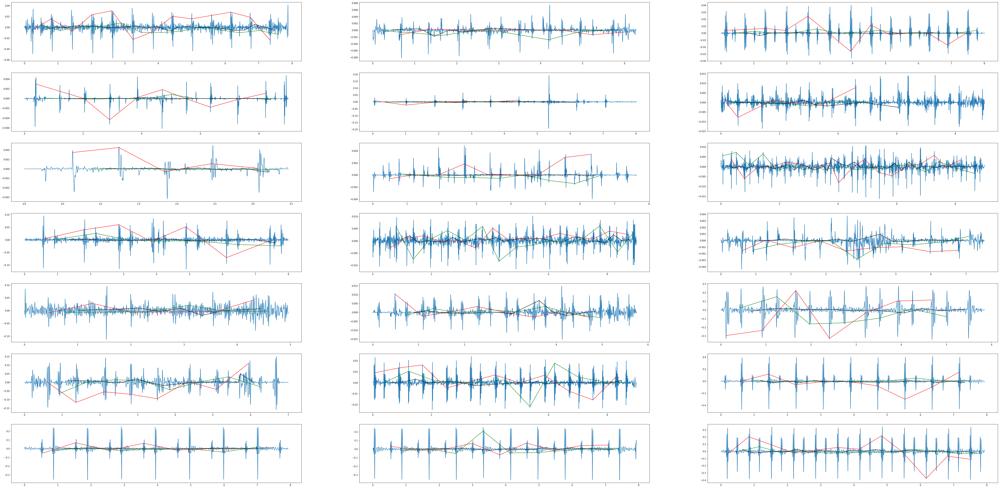

In [24]:
plt.figure(figsize=(80, 40))
for i in range(normal_group.signal_df.shape[0]):
    plt.subplot(7, 3, i + 1)
    tmp = normal_group.filtered_signal_df.iloc[i].dropna()
    tmp_lub_dub = s1_s2_exact_pos.iloc[i]
    s1 = tmp_lub_dub[tmp_lub_dub == 'S1']
    s2 = tmp_lub_dub[tmp_lub_dub == 'S2']
    n = tmp_lub_dub[tmp_lub_dub == 'N']
    
    y = tmp.values
    x = (1.0 * np.arange(1, (tmp.shape[0] + 1)))/normal_group.samplerate
    plt.plot(x, y)
    plt.plot((1.0*(s1.index))/normal_group.samplerate, tmp[s1.index], '-r')
    plt.plot((1.0*(s2.index))/normal_group.samplerate, tmp[s2.index], '-g')
    plt.plot((1.0*(n.index))/normal_group.samplerate, tmp[n.index], '-k')
    
    # sound_tmp = tmp * 0.5/tmp.max() # use 0.5 to increase amplitude
    # sf.write('test_{0}.wav'.format(i), sound_tmp, normal_group.samplerate)

    

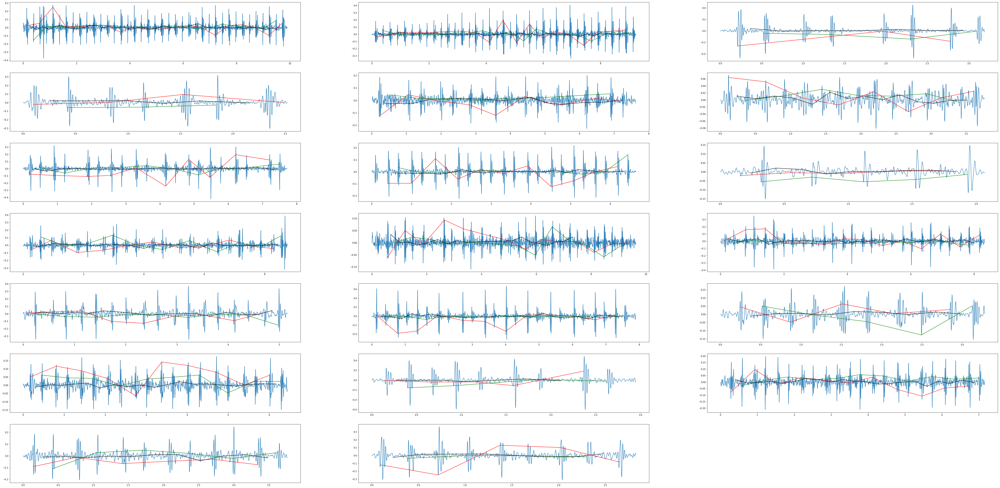

In [47]:
plt.figure(figsize=(80, 40))
for i in range(20):
    plt.subplot(7, 3, i + 1)
    tmp = normal_group.filtered_signal_df.iloc[i].dropna()
    tmp_lub_dub = s1_s2_exact_pos.iloc[i]
    s1 = tmp_lub_dub[tmp_lub_dub == 'S1']
    s2 = tmp_lub_dub[tmp_lub_dub == 'S2']
    n = tmp_lub_dub[tmp_lub_dub == 'N']
    
    y = tmp.values
    x = (1.0 * np.arange(1, (tmp.shape[0] + 1)))/normal_group.samplerate
    plt.plot(x, y)
    plt.plot((1.0*(s1.index))/normal_group.samplerate, tmp[s1.index], '-r')
    plt.plot((1.0*(s2.index))/normal_group.samplerate, tmp[s2.index], '-g')
    plt.plot((1.0*(n.index))/normal_group.samplerate, tmp[n.index], '-k')
    
    # sound_tmp = tmp * 0.5/tmp.max() # use 0.5 to increase amplitude
    # sf.write('test_{0}.wav'.format(i), sound_tmp, normal_group.samplerate)

    

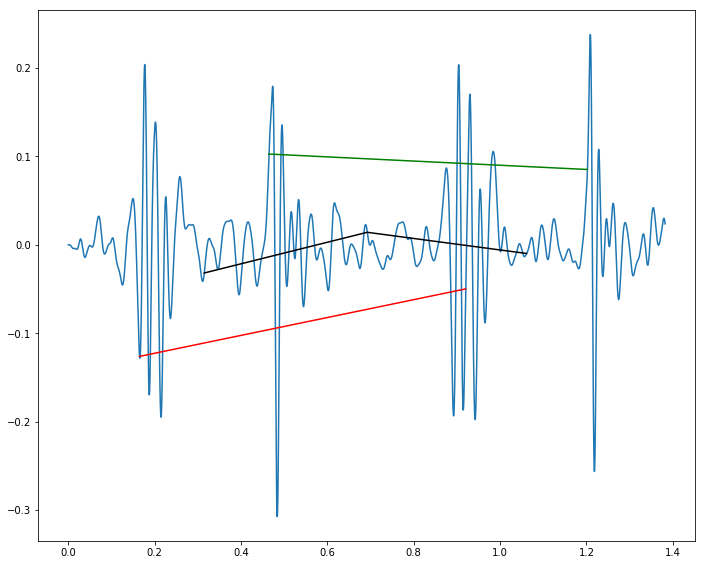

In [48]:
plt.figure(figsize=(40, 80))
i = 20

plt.subplot(7, 3, i + 1)
tmp = normal_group.filtered_signal_df.iloc[i].dropna()
tmp_lub_dub = s1_s2_exact_pos.iloc[i]
s1 = tmp_lub_dub[tmp_lub_dub == 'S1']
s2 = tmp_lub_dub[tmp_lub_dub == 'S2']
n = tmp_lub_dub[tmp_lub_dub == 'N']

y = tmp.values
x = (1.0 * np.arange(1, (tmp.shape[0] + 1)))/normal_group.samplerate
plt.plot(x, y)
plt.plot((1.0*(s1.index))/normal_group.samplerate, tmp[s1.index], '-r')
plt.plot((1.0*(s2.index))/normal_group.samplerate, tmp[s2.index], '-g')
plt.plot((1.0*(n.index))/normal_group.samplerate, tmp[n.index], '-k')

# sound_tmp = tmp * 0.5/tmp.max() # use 0.5 to increase amplitude
# sf.write('test_{0}.wav'.format(i), sound_tmp, normal_group.samplerate)

    

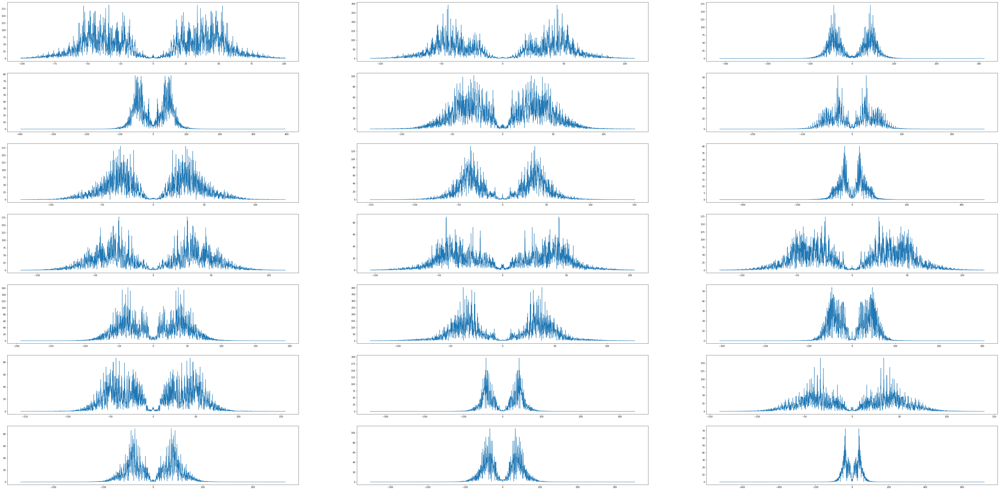

In [50]:
plt.figure(figsize=(80, 40))
for i in range(21):
    plt.subplot(7, 3, i + 1)
    tmp = normal_group.filtered_signal_df.iloc[i].dropna()
    fft_signal = fftpack.fftshift(fftpack.fft(tmp))
    fft_freqs = fftpack.fftshift(fftpack.fftfreq(tmp.shape[0], 1.0/normal_group.samplerate))
    lim = range(fft_signal.shape[0]/2-1000, fft_signal.shape[0]/2+1000)
    
    plt.plot(fft_freqs[lim], np.abs(fft_signal[lim]))
    
    

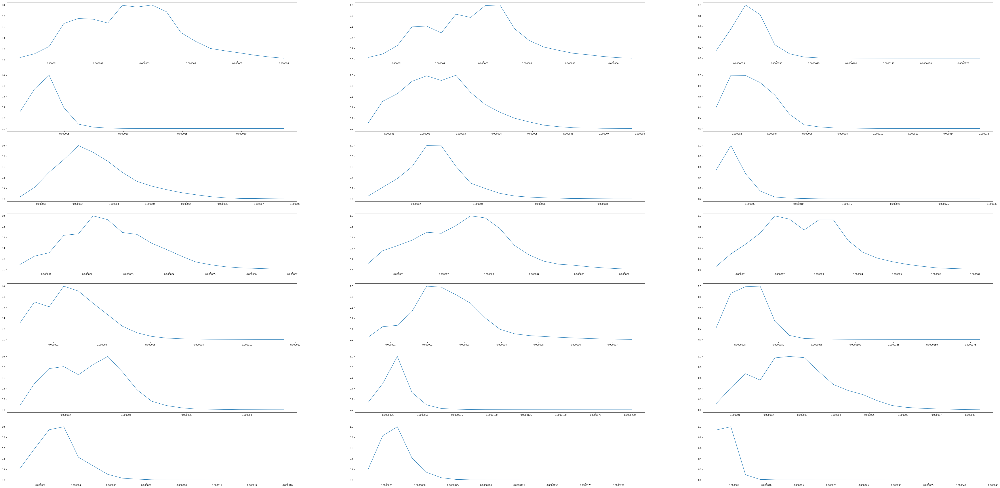

In [51]:
plt.figure(figsize=(80, 40))
signal_results = {}
for i in range(21):
    plt.subplot(7, 3, i + 1)
    tmp = normal_group.filtered_signal_df.iloc[i].dropna()
    fft_signal = fftpack.fft(tmp)
    fft_freqs = fftpack.fftfreq(tmp.shape[0], normal_group.samplerate)
    lim = range(1000)
    win = 50

    tmp2 = pd.Series(np.abs(fft_signal[lim]), index=fft_freqs[lim])
    tmp2 = tmp2.rolling(window=win).mean().iloc[list(np.arange(0, tmp2.shape[0], win))].dropna()
    signal_results[tmp.name] = pd.Series(np.abs(tmp2.values)/(1.0*np.abs(tmp2.values).max()), index=tmp2.index)
    plt.plot(tmp2.index, np.abs(tmp2.values)/(1.0*np.abs(tmp2.values).max()))
    
    

In [52]:
fft_signal_results_df = pd.DataFrame(signal_results).T.fillna(0)


In [53]:
test = s1_s2_exact_pos.apply(lambda x: list(x[(x=='S1')|(x=='S2')|(x=='N')].index), axis=1)

In [57]:
0.1*4000

400.0

In [58]:
window=400
data = {}
signal_df = normal_group.filtered_signal_df
for k,v in test.iteritems():
    data[k] = {}
    tmp = signal_df.loc[k].dropna()
    for bins in v:
        p1 = max(0, bins - window/2)
        p2 = min(bins + window/2, len(tmp))
        subset = tmp[range(p1, p2)].values
        if len(subset) < window:
            subset = np_pad(subset, window)
        freqs = fftpack.fftfreq(subset.shape[0])[:subset.shape[0]/2]
        fft_amp = np.abs(fftpack.fft(subset))[:subset.shape[0]/2]
        data[k][bins] = pd.Series(fft_amp, index=freqs)
            

In [59]:
spec_panel_data = pd.Panel(data)
# plt.pcolor(np.log(pd.Panel(data).iloc[0].dropna(axis=1).values))

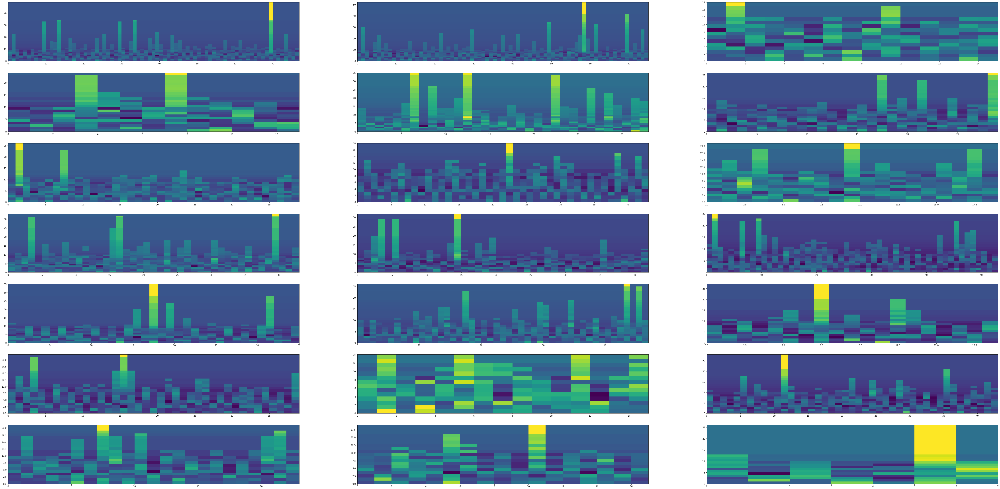

In [61]:
plt.figure(figsize=(80, 40))
normalized_spec_data = {}
for i in range(21):
    plt.subplot(7, 3, i + 1)
    tmp = spec_panel_data.iloc[i].dropna(axis=1).fillna(0)
    tmp = tmp/tmp.max(axis=0)
    tmp[tmp<0.05] = 0
    tmp = tmp.subtract(
        tmp.mean(axis=1).values,
        axis=0
    ).divide(
        tmp.std(axis=1).values,
        axis=0
    ).fillna(0)

    tmp = tmp[tmp.std(axis=1)>0]
    normalized_spec_data[spec_panel_data.items[i]] = tmp.copy()
    plt.pcolor(tmp.values)
    

In [62]:
normalized_spec_data = pd.Panel(normalized_spec_data)

In [63]:
Sxx_to_df = normalized_spec_data.to_frame(filter_observations=False).stack().swaplevel(0).unstack().fillna(0)
Sxx_to_df

major                                     0.0000    0.0025    0.0050  \
                                 minor                                 
normal__103_1305031931979_D1.wav 430    0.232898 -0.461404  0.877262   
                                 988    2.358336  2.232027  0.761154   
                                 1547  -1.018984 -1.073447  0.122179   
                                 1976  -0.095197 -0.566268 -1.154275   
                                 2406  -0.393063 -0.745437 -1.509603   
                                 2922  -0.132908 -0.470190 -0.045617   
                                 3437  -1.018984 -1.096529 -1.263611   
                                 3952   0.633398  0.651372  1.447717   
                                 4468  -0.458683 -0.551350 -0.578502   
                                 4940   1.173573  1.841108 -0.703403   
                                 5413  -1.018984 -0.960614 -0.109995   
                                 5886  -0.727138 -0.727001  1.447717   
                                 6358  -1.018984 -0.607683 -0.517766   
                                 6874   1.140418  0.366962  0.953931   
                                 7389  -0.604163 -0.853686 -0.698401   
                                 7904  -0.650616  1.140909  1.172401   
                                 8420  -0.107240 -0.131372 -0.554606   
                                 8936   3.036757  1.999795  1.447717   
                                 9451  -1.018984 -0.786537 -0.495739   
                                 9966  -0.462292  0.228628  1.447717   
                                 10482  0.138673 -0.435654 -1.210508   
                                 10998 -0.225024  0.318098  1.447717   
                                 11514 -0.313404 -1.016423  0.448698   
                                 12030  2.773360  1.376027  0.054086   
                                 12545  1.143244  0.160698 -1.183479   
                                 13060  0.084530 -0.164165  1.447717   
                                 13576 -0.743822 -1.135976 -0.349186   
                                 14092  0.804212 -0.724266  1.447717   
                                 14607 -0.464614 -0.419180 -1.009113   
                                 15080  0.749546  1.487320  0.886867   
...                                          ...       ...       ...   
normal__129_1306344506305_D1.wav 11380 -0.131465 -0.259875  1.866950   
                                 11951 -0.011225 -0.095854 -0.697571   
                                 12653 -0.590524  0.331321 -0.756100   
                                 13355 -0.935618 -0.826654 -0.718126   
                                 13926  0.757808 -1.015296  1.866950   
                                 14498 -0.455622 -0.127942 -0.121975   
normal__133_1306759619127_B.wav  368   -0.761806 -0.432574 -1.041841   
                                 944    0.053556  2.831450  1.301555   
                                 1521   0.760449 -0.061306 -0.825471   
                                 2184  -0.761806  0.106437  1.183066   
                                 2846  -0.268140 -0.788259 -0.450503   
                                 3447   3.145886  1.700565  1.428854   
                                 4048  -0.761806 -0.633487 -1.295677   
                                 4772   0.513307 -0.643535 -0.051252   
                                 5495  -0.761806 -1.065794 -0.696240   
                                 6059   0.069385 -0.244801 -0.396005   
                                 6623   0.595551  0.049981 -1.437545   
                                 7347  -0.761806  0.091282 -0.153259   
                                 8071  -0.761806 -0.689709  0.323437   
                                 8635   0.748438  0.717762  1.428854   
                                 9199   0.143406 -0.170989 -0.286339   
                                 9898  -0.429200  0.298769  1.428854   
                                 10598 -

In [16]:
# overlap = window - 1
# window_freqs, window_time_points, Sxx = normal_group.spectrogram(
#    window_size=window,
#    noverlap=overlap, #int(normal_group.heart_beat_rate_to_sampling_rate(80)/6),
#)
# Sxx_to_df = Sxx.to_frame(filter_observations=False).stack().swaplevel(0).unstack()

MemoryError: 

In [64]:
Sxx_to_df

major                                     0.0000    0.0025    0.0050  \
                                 minor                                 
normal__103_1305031931979_D1.wav 430    0.232898 -0.461404  0.877262   
                                 988    2.358336  2.232027  0.761154   
                                 1547  -1.018984 -1.073447  0.122179   
                                 1976  -0.095197 -0.566268 -1.154275   
                                 2406  -0.393063 -0.745437 -1.509603   
                                 2922  -0.132908 -0.470190 -0.045617   
                                 3437  -1.018984 -1.096529 -1.263611   
                                 3952   0.633398  0.651372  1.447717   
                                 4468  -0.458683 -0.551350 -0.578502   
                                 4940   1.173573  1.841108 -0.703403   
                                 5413  -1.018984 -0.960614 -0.109995   
                                 5886  -0.727138 -0.727001  1.447717   
                                 6358  -1.018984 -0.607683 -0.517766   
                                 6874   1.140418  0.366962  0.953931   
                                 7389  -0.604163 -0.853686 -0.698401   
                                 7904  -0.650616  1.140909  1.172401   
                                 8420  -0.107240 -0.131372 -0.554606   
                                 8936   3.036757  1.999795  1.447717   
                                 9451  -1.018984 -0.786537 -0.495739   
                                 9966  -0.462292  0.228628  1.447717   
                                 10482  0.138673 -0.435654 -1.210508   
                                 10998 -0.225024  0.318098  1.447717   
                                 11514 -0.313404 -1.016423  0.448698   
                                 12030  2.773360  1.376027  0.054086   
                                 12545  1.143244  0.160698 -1.183479   
                                 13060  0.084530 -0.164165  1.447717   
                                 13576 -0.743822 -1.135976 -0.349186   
                                 14092  0.804212 -0.724266  1.447717   
                                 14607 -0.464614 -0.419180 -1.009113   
                                 15080  0.749546  1.487320  0.886867   
...                                          ...       ...       ...   
normal__129_1306344506305_D1.wav 11380 -0.131465 -0.259875  1.866950   
                                 11951 -0.011225 -0.095854 -0.697571   
                                 12653 -0.590524  0.331321 -0.756100   
                                 13355 -0.935618 -0.826654 -0.718126   
                                 13926  0.757808 -1.015296  1.866950   
                                 14498 -0.455622 -0.127942 -0.121975   
normal__133_1306759619127_B.wav  368   -0.761806 -0.432574 -1.041841   
                                 944    0.053556  2.831450  1.301555   
                                 1521   0.760449 -0.061306 -0.825471   
                                 2184  -0.761806  0.106437  1.183066   
                                 2846  -0.268140 -0.788259 -0.450503   
                                 3447   3.145886  1.700565  1.428854   
                                 4048  -0.761806 -0.633487 -1.295677   
                                 4772   0.513307 -0.643535 -0.051252   
                                 5495  -0.761806 -1.065794 -0.696240   
                                 6059   0.069385 -0.244801 -0.396005   
                                 6623   0.595551  0.049981 -1.437545   
                                 7347  -0.761806  0.091282 -0.153259   
                                 8071  -0.761806 -0.689709  0.323437   
                                 8635   0.748438  0.717762  1.428854   
                                 9199   0.143406 -0.170989 -0.286339   
                                 9898  -0.429200  0.298769  1.428854   
                                 10598 -

In [67]:
# potential features
abs_values_column = abs_values.stack(dropna=False)
abs_values_differential_column = abs_value_differences.stack(dropna=False)
amplitude_values_differential_column = amplitude_difference.stack(dropna=False)
window_average_abs_value_column = average_abs_values.stack(dropna=False)


In [68]:
# merge all potential features
features_and_output = pd.concat([
    abs_values_column,
    abs_values_differential_column,
    amplitude_values_differential_column,
    window_average_abs_value_column,
    Sxx_to_df,
    s1_s2_exact_pos.stack()
],axis=1, join='inner', keys=['abs_val', 'abs_val_diff', 'amp_diff', 'avg_window', 'avg_spec', 's1_s2_output'])
    

In [69]:
# NOW also include the frequency for an entire WAV file
fft_signal_results_df.columns = pd.MultiIndex.from_product(
    [['Signal_frequencies'], fft_signal_results_df.columns]
)
# finally add in the "signal_frequencies" set of features
features_and_output = features_and_output.reset_index().set_index('level_0').merge(  # or 'basename'???
    fft_signal_results_df, 
    left_index=True,
    right_index=True
).reset_index().set_index(['index', 'level_1'])


In [70]:
features_and_output

abs_val abs_val_diff  amp_diff  \
major                                     0.000000     1.000000  2.000000   
index                            level_1                                    
normal__103_1305031931979_D1.wav 430      0.022602    -0.001254 -0.001254   
                                 988      0.023580     0.000186  0.000186   
                                 1547     0.155317     0.006034 -0.006034   
                                 1976     0.023947     0.000097 -0.000097   
                                 2406     0.052425     0.000483  0.000483   
                                 2922     0.008451    -0.000703 -0.000703   
                                 3437     0.011579     0.001167  0.001167   
                                 3952     0.020565     0.000235 -0.000235   
                                 4468     0.250999    -0.008260 -0.008260   
                                 4940     0.020635    -0.000289 -0.000289   
                                 5413     0.016917     0.000507  0.000507   
                                 5886     0.025121    -0.000166 -0.000166   
                                 6358     0.018830    -0.000063 -0.000063   
                                 6874     0.006711    -0.000330  0.000330   
                                 7389     0.002287     0.000396  0.000396   
                                 7904     0.013343     0.001570 -0.001570   
                                 8420     0.008462    -0.002306 -0.002306   
                                 8936     0.001882    -0.000997  0.000997   
                                 9451     0.028640     0.000455  0.000455   
                                 9966     0.023631     0.001462  0.001462   
                                 10482    0.030034     0.002607  0.002607   
                                 10998    0.025846    -0.001314 -0.001314   
                                 11514    0.029483     0.000592  0.000592   
                                 12030    0.001813     0.000238 -0.000238   
                                 12545    0.026101     0.000795  0.000795   
                                 13060    0.017194     0.000438  0.000438   
                                 13576    0.027242    -0.000576 -0.000576   
                                 14092    0.003282    -0.000065  0.000065   
                                 14607    0.056447     0.003284 -0.003284   
                                 15080    0.010017     0.000913  0.000913   
...                                            ...          ...       ...   
normal__129_1306344506305_D1.wav 10808    0.029422    -0.005118  0.005118   
                                 11380    0.001923    -0.000666  0.000666   
                                 11951    0.022217     0.007626 -0.007626   
                                 12653    0.010341    -0.000319 -0.000319   
                                 13355    0.074991     0.001087 -0.001087   
                                 13926    0.017037    -0.000480  0.000480   
                                 14498    0.027907     0.001371  0.001371   
normal__133_1306759619127_B.wav  944      0.023209    -0.000661  0.000661   
                                 1521     0.035955     0.000874 -0.000874   
                                 2184     0.015649    -0.001611 -0.001611   
                                 2846     0.247197     0.002275 -0.002275   
                                 3447     0.017113     0.000841  0.000841   
                                 4048     0.001778     0.000121 -0.003435   
                                 4772     0.018307    -0.000365 -0.000365   
                                 5495     0.129684     0.005200  0.005200   
                                 6059     0.002395     0.001905  0.002886   
                                 6623     0.003265    -0.000794  0.000794   
                                 7347     0.017122    -0.000871  0.000871   
                                 8071  

In [ ]:
# divide data into X and Y features

In [73]:
y_output = features_and_output['s1_s2_output'].copy()
features_to_try = [
    'Signal_frequencies',
    'abs_val', 'abs_val_diff', 'amp_diff', 'avg_window', 'avg_spec'
]
features = features_and_output[features_to_try].copy().fillna(0)

In [72]:
# y_output[(y_output=='S1')|(y_output=='S2')] = 'S'

In [74]:
from sklearn.preprocessing import LabelEncoder
LE_output = LabelEncoder()
y = LE_output.fit_transform(y_output.squeeze().values)

In [75]:
np.unique(y)

array([0, 1, 2])

In [76]:
from sklearn.cross_validation import train_test_split


In [77]:
X = features.values
X.shape

(723, 455)

** Lets try some models **

KNN

In [78]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler
[Xtrain, Xtest, Ytrain, Ytest] = train_test_split(X, y, test_size=0.8)
TrainScale = StandardScaler()
Xtrain_std = TrainScale.fit_transform(Xtrain)
Xtest_std = TrainScale.transform(Xtest)

knn = KNeighborsClassifier(n_neighbors=2, p=2, metric='minkowski')
knn.fit(Xtrain_std, Ytrain)
accuracy_score(Ytest, knn.predict(Xtest_std))

0.60967184801381691

In [79]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
[Xtrain, Xtest, Ytrain, Ytest] = train_test_split(X, y, test_size=0.8)
TrainScale = StandardScaler()
Xtrain_std = TrainScale.fit_transform(Xtrain)
Xtest_std = TrainScale.transform(Xtest)

tree = DecisionTreeClassifier(criterion='entropy', max_depth=30)
tree.fit(Xtrain, Ytrain)
accuracy_score(Ytest, tree.predict(Xtest))

0.68221070811744389

In [87]:
from sklearn.svm import SVC
svm = SVC(kernel='rbf', C=1)
[Xtrain, Xtest, Ytrain, Ytest] = train_test_split(X, y, test_size=0.8)

TrainScale = StandardScaler()
Xtrain_std = TrainScale.fit_transform(Xtrain)
Xtest_std = TrainScale.transform(Xtest)

svm.fit(Xtrain_std, Ytrain)
accuracy_score(Ytest, svm.predict(Xtest_std))

0.36269430051813473

In [100]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression(C=1000)

[Xtrain, Xtest, Ytrain, Ytest] = train_test_split(X, y, test_size=0.8)

TrainScale = MinMaxScaler()
Xtrain_std = TrainScale.fit_transform(Xtrain)
Xtest_std = TrainScale.transform(Xtest)

lr.fit(Xtrain_std, Ytrain)
accuracy_score(Ytest, lr.predict(Xtest_std))

0.69430051813471505

In [101]:
from sklearn.base import BaseEstimator
from sklearn.base import ClassifierMixin
from sklearn.preprocessing import LabelEncoder
from sklearn.externals import six
from sklearn.base import clone
from sklearn.pipeline import _name_estimators
import operator
from sklearn.ensemble import BaggingClassifier
tree = DecisionTreeClassifier(criterion='entropy', max_depth=30)
[Xtrain, Xtest, Ytrain, Ytest] = train_test_split(X, y, test_size=0.8)

bag = BaggingClassifier(
    base_estimator=tree,
    n_estimators=5000,
    max_samples=1.0,
    max_features=1.0,
    bootstrap=True,
    bootstrap_features=True,
    n_jobs=16
)
bag = bag.fit(Xtrain, Ytrain)
y_train_pred = bag.predict(Xtrain)
y_test_pred = bag.predict(Xtest)
print(accuracy_score(Ytrain, y_train_pred))
print(accuracy_score(Ytest, y_test_pred))


1.0
0.791018998273


In [102]:
from sklearn.ensemble import RandomForestClassifier
forest = RandomForestClassifier(
    n_estimators=10000,
    n_jobs=16
)
forest.fit(Xtrain, Ytrain)
importances = forest.feature_importances_
y_train_pred = forest.predict(Xtrain)
y_test_pred = forest.predict(Xtest)
print(accuracy_score(Ytrain, y_train_pred))
print(accuracy_score(Ytest, y_test_pred))

1.0
0.778929188256


In [103]:
feat_labels = features.columns
indices = np.argsort(importances)[::-1]
for f in range(Xtrain.shape[0]):
    print("{0}, {1}, {2}".format(f + 1, feat_labels[indices[f]], importances[indices[f]]))

1, ('avg_spec', 0.0125), 0.0859497268842
2, ('avg_spec', 0.015), 0.0644399944895
3, ('avg_spec', 0.01), 0.0562695345075
4, ('avg_spec', 0.0025), 0.05482873709
5, ('abs_val', 0.0), 0.0519629977802
6, ('avg_window', 3.0), 0.0495246604949
7, ('abs_val_diff', 1.0), 0.0436960195772
8, ('avg_spec', 0.0175), 0.0424011244264
9, ('amp_diff', 2.0), 0.0417121342325
10, ('avg_spec', 0.005), 0.0339330650069
11, ('avg_spec', 0.02), 0.0304004510469
12, ('avg_spec', 0.0), 0.026051380036
13, ('avg_spec', 0.0075), 0.0249508180833
14, ('avg_spec', 0.0225), 0.0236818726033
15, ('avg_spec', 0.0275), 0.0178539457481
16, ('avg_spec', 0.025), 0.0173425693333
17, ('avg_spec', 0.03), 0.0133202802358
18, ('avg_spec', 0.0325), 0.0129283596864
19, ('avg_spec', 0.035), 0.00889336843945
20, ('avg_spec', 0.04), 0.0086675193573
21, ('avg_spec', 0.0375), 0.00852136036751
22, ('avg_spec', 0.0425), 0.00712471381362
23, ('avg_spec', 0.05), 0.00693268118369
24, ('avg_spec', 0.0475), 0.00653485376073
25, ('avg_spec', 0.0525